In [1]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import copy
import scipy.sparse as sp

import os
import cv2
import skimage as ski
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import pyplot, cm
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
Image.MAX_IMAGE_PIXELS = None

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

from plot_spatial_all import get_rgb_function,plot_spatial_general,plot_spatial_all,rgb_to_ryb,ryb_to_rgb,hex2rgb_3
from plot_spatial_all import plot_Multiple

from st_processing import dis_two_point,get_chip_coord,get_distance_from_point_to_line,get_piexl_coods,get_piexl_coods_Mchip,getLinearEquation_new
from st_processing import rgb2gray,adata_flip,adata_Srotate,get_HE_mask_3d,get_HE_mask
from st_processing import get_adata_STARsolo,get_adata_STARsolo_10x
from st_processing import load_image,Srotate,rgba_to_hex

import loompy

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'

color_list=['#1f77b4','#ff7f0e','#f8e72e','#78c679','#9467bd','#807dba','#ffdab5',
            '#8c564b','#e377c2','#bcbd22','#12d9b9',
            '#8da0cb','#2ca02c','#9c9ede','#fb8072','#999999']
region_index_list=['DPall','MPall','Olfactory_areas','CSPall','TelA','Ventricular_systems',
                'Diencephalon','Hypothalamus','Meninges','Midbrain','Hindbrain']



# Fig5-B

In [3]:
adata_cell=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_cell.h5ad')
adata_cell

AnnData object with n_obs × n_vars = 97818 × 102
    obs: 'sample', 'reg', 'Spot_col', 'Spot_row', 'z', 'region', 'color_list', 'color_seq', 'col', 'row', 'height'
    var: 'tissue'
    obsm: 'spatial', 'spatial_3d_align'

In [5]:
df_obs=adata_cell.obs


In [6]:
df_obs['type3']='other'
df_obs['type3'][df_obs['type2'].isin(['Meninges'])]='Meninges'
df_obs['type3'][df_obs['type2'].isin(['Midbrain','Ventricular_systems_Midbrain'])]='Midbrain'
df_obs['type3'][df_obs['type2'].isin(['Ventricular_systems_Hindbrain','Hindbrain_1','Hindbrain_2'])]='Hindbrain'
df_obs['type3'][df_obs['type3']=='other'] = 'Forebrain'

df1=pd.DataFrame({'Region1':list(df_obs['type3'].value_counts().index),
            'count':list(df_obs['type3'].value_counts())})
df1

,Region1,count
0,Forebrain,65825
1,Hindbrain,14325
2,Meninges,9052
3,Midbrain,8616


In [7]:
df_obs['type4']='other'
df_obs['type4'][df_obs['type2'].isin(['Meninges'])]='Meninges'
df_obs['type4'][df_obs['type2'].isin(['Midbrain','Ventricular_systems_Midbrain'])]='Midbrain'
df_obs['type4'][df_obs['type2'].isin(['Ventricular_systems_Hindbrain','Hindbrain_1','Hindbrain_2'])]='Hindbrain'
df_obs['type4'][df_obs['type2'].isin(['Diencephalon'])]='Diencephalon'
df_obs['type4'][df_obs['type4']=='other']='Secondary_prosencephalon'
df2=pd.DataFrame({'Region2':list(df_obs['type4'].value_counts().index),
            'count':list(df_obs['type4'].value_counts())})
df2

,Region2,count
0,Secondary_prosencephalon,53670
1,Hindbrain,14325
2,Diencephalon,12155
3,Meninges,9052
4,Midbrain,8616


In [8]:
df_obs['type5']='other'
df_obs['type5'][df_obs['type2'].isin(['Meninges'])]='Meninges'
df_obs['type5'][df_obs['type2'].isin(['Midbrain'])]='Midbrain'
df_obs['type5'][df_obs['type2'].isin(['Hindbrain_1','Hindbrain_2'])]='Hindbrain'
df_obs['type5'][df_obs['type2'].isin(['Diencephalon'])]='Diencephalon'
df_obs['type5'][df_obs['type2'].isin(['CSPall','CSPall_1','CSPall_2'])]='CSPall'
#df_obs['type5'][df_obs['type2'].isin(['DPall','DPall_1','DPall_2'])]='DPall'
df_obs['type5'][df_obs['type2'].isin(['DPall_0','DPall_1','DPall_2','DPall_3'])]='DPall'

df_obs['type5'][df_obs['type2'].isin(['Olfactory_areas'])]='Olfactory_areas'
#df_obs['type5'][df_obs['type2'].isin(['TelA_1','TelA_2','TelA_3','TelA_4'])]='TelA'
df_obs['type5'][df_obs['type2'].isin(['TelA'])]='TelA'
df_obs['type5'][df_obs['type2'].isin(['Hypothalamus'])]='Hypothalamus'
df_obs['type5'][df_obs['type2'].isin(['MPall'])]='MPall'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Forebrain'])]='Ventricular_systems_Forebrain'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Midbrain'])]='Ventricular_systems_Midbrain'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Hindbrain'])]='Ventricular_systems_Hindbrain'
df3=pd.DataFrame({'Region3':list(df_obs['type5'].value_counts().index),
            'count':list(df_obs['type5'].value_counts())})
df3

,Region3,count
0,DPall,18021
1,Hindbrain,14045
2,Diencephalon,12155
3,CSPall,10618
4,Meninges,9052
5,Hypothalamus,8699
6,Midbrain,8069
7,Olfactory_areas,6219
8,Ventricular_systems_Forebrain,4650
9,MPall,4136


In [9]:
df_obs['type5']='other'
df_obs['type5'][df_obs['type2'].isin(['Meninges'])]='Meninges'
df_obs['type5'][df_obs['type2'].isin(['Midbrain'])]='Midbrain'
df_obs['type5'][df_obs['type2'].isin(['Hindbrain_1','Hindbrain_2'])]='Hindbrain'
df_obs['type5'][df_obs['type2'].isin(['Diencephalon'])]='Diencephalon'
df_obs['type5'][df_obs['type2'].isin(['CSPall','CSPall_1','CSPall_2'])]='CSPall'
#df_obs['type5'][df_obs['type2'].isin(['DPall','DPall_1','DPall_2'])]='DPall'
df_obs['type5'][df_obs['type2'].isin(['DPall_0','DPall_1','DPall_2','DPall_3'])]='DPall'

df_obs['type5'][df_obs['type2'].isin(['Olfactory_areas'])]='Olfactory_areas'
#df_obs['type5'][df_obs['type2'].isin(['TelA_1','TelA_2','TelA_3','TelA_4'])]='TelA'
df_obs['type5'][df_obs['type2'].isin(['TelA'])]='TelA'
df_obs['type5'][df_obs['type2'].isin(['Hypothalamus'])]='Hypothalamus'
df_obs['type5'][df_obs['type2'].isin(['MPall'])]='MPall'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Forebrain'])]='Ventricular_systems'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Midbrain'])]='Ventricular_systems'
df_obs['type5'][df_obs['type2'].isin(['Ventricular_systems_Hindbrain'])]='Ventricular_systems'
df4=pd.DataFrame({'Region4':list(df_obs['type5'].value_counts().index),
            'count':list(df_obs['type5'].value_counts())})
df4

,Region4,count
0,DPall,18021
1,Hindbrain,14045
2,Diencephalon,12155
3,CSPall,10618
4,Meninges,9052
5,Hypothalamus,8699
6,Midbrain,8069
7,Olfactory_areas,6219
8,Ventricular_systems,5477
9,MPall,4136


In [10]:
df2['Region2']=['Secondary_prosencephalon','Hindbrain2','Diencephalon2','Meninges2','Midbrain2']
df2['Region1']=['Forebrain','Hindbrain1','Forebrain','Meninges1','Midbrain1']
df2

,Region2,count,Region1
0,Secondary_prosencephalon,53670,Forebrain
1,Hindbrain2,14325,Hindbrain1
2,Diencephalon2,12155,Forebrain
3,Meninges2,9052,Meninges1
4,Midbrain2,8616,Midbrain1


In [11]:
df3['Region2']=['Secondary_prosencephalon','Hindbrain2','Diencephalon2','Secondary_prosencephalon','Meninges2','Secondary_prosencephalon',
              'Midbrain2', 'Secondary_prosencephalon','Secondary_prosencephalon','Secondary_prosencephalon','Secondary_prosencephalon','Midbrain2','Hindbrain2']
df3['Region3'][8]='Ventricular_systems'
df3['Region3'][11]='Ventricular_systems'
df3['Region3'][12]='Ventricular_systems'
df3

,Region3,count,Region2
0,DPall,18021,Secondary_prosencephalon
1,Hindbrain,14045,Hindbrain2
2,Diencephalon,12155,Diencephalon2
3,CSPall,10618,Secondary_prosencephalon
4,Meninges,9052,Meninges2
5,Hypothalamus,8699,Secondary_prosencephalon
6,Midbrain,8069,Midbrain2
7,Olfactory_areas,6219,Secondary_prosencephalon
8,Ventricular_systems,4650,Secondary_prosencephalon
9,MPall,4136,Secondary_prosencephalon


In [12]:
assignedName = {'CSPall':'CSPall',
 'CSPall_1':'CSPall',
 'CSPall_2':'CSPall',
 'DPall_0':'DPall',
 'DPall_1':'DPall',
 'DPall_2':'DPall',
 'DPall_3':'DPall',
 'Diencephalon':'Diencephalon',
 'Hindbrain':'Hindbrain',
 'Hypothalamus':'Hypothalamus',
 'MPall':'MPall',
 'Meninges':'Meninges',
 'Midbrain':'Midbrain',
 'Olfactory_areas':'Olfactory_areas',
 'TelA':'TelA',
 'Ventricular_systems':'Ventricular_systems'}
adata_cell.obs['Brain_region'] = (adata_cell.obs['Brain_region'].map(assignedName).astype('category'))

In [13]:
df_obs['Brain_region']=list(adata_cell.obs['Brain_region'])

In [14]:
set(df_obs['Brain_region'])

{'CSPall',
 'DPall',
 'Diencephalon',
 'Hindbrain',
 'Hypothalamus',
 'MPall',
 'Meninges',
 'Midbrain',
 'Olfactory_areas',
 'TelA',
 'Ventricular_systems'}

In [15]:
df_cell=pd.DataFrame(adata_cell.X.A,index=adata_cell.obs_names,columns=adata_cell.var_names)
df_cell['Brain_region']=adata_cell.obs['Brain_region']

df_cell_abundence=df_cell.groupby('Brain_region').sum().T
df_cell_abundence

Brain_region,CSPall,DPall,Diencephalon,Hindbrain,Hypothalamus,MPall,Meninges,Midbrain,Olfactory_areas,TelA,Ventricular_systems
Blood-Erythrocyte,4099.570876,9030.104023,5097.276346,4028.780953,2591.639186,1651.867402,10077.965233,2522.556283,2155.446049,990.113216,1788.574433
Blood-Erythroid progenitor,507.084553,1014.508832,744.771552,758.973176,471.806623,164.006794,569.608203,470.172059,422.193176,50.203402,112.126617
Blood-Platelet,141.109999,323.244195,285.159629,346.779787,155.971509,83.902472,289.025537,205.821653,190.193825,30.200751,69.174498
Choroid plexus-Choroid plexus,725.664685,1197.262888,426.496456,2218.284916,445.047423,406.448372,597.500490,312.800389,381.831149,77.194359,4155.134091
Ectoderm-Olfactory epithelium,349.664857,596.440394,217.080255,293.079134,194.623702,168.577648,194.392616,202.024250,160.043136,53.132918,281.746920
...,...,...,...,...,...,...,...,...,...,...,...
Subcommissural organ-Subcommissural organ hypendymal cell,163.197773,170.128695,416.117434,543.079157,229.418577,46.829056,166.528835,289.589526,132.900635,18.884194,382.168054
Vascular-Angioblast,189.036480,826.206791,172.245633,171.380498,113.052757,166.834091,314.119003,105.436432,203.802745,53.261848,85.371552
Vascular-Endothelial,1152.187171,3211.558156,1750.092642,1109.104544,960.960461,931.562590,5975.730638,805.278785,1079.140538,551.977479,411.872684
Vascular-Pericyte,204.000350,585.713849,513.438417,381.933772,235.794412,159.430955,901.762866,240.764075,201.917281,100.197195,168.678879


In [16]:
df_cell_anno=pd.read_csv('cell_annotation.csv',index_col=0)
df_cell_anno=df_cell_anno.loc[list(df_cell_abundence.index),:]
df_cell_anno

,cell_Region,cell_type,cell_class
cell,,,
Blood-Erythrocyte,Blood,Blood,Non-neuronal
Blood-Erythroid progenitor,Blood,Blood,Non-neuronal
Blood-Platelet,Blood,Blood,Non-neuronal
Choroid plexus-Choroid plexus,Choroid plexus,Choroid plexus,Non-neuronal
Ectoderm-Olfactory epithelium,Ectoderm,Epithelium,Non-neuronal
...,...,...,...
Subcommissural organ-Subcommissural organ hypendymal cell,Subcommissural organ,Hypendymal cell,Non-neuronal
Vascular-Angioblast,Vascular,Angioblast,Non-neuronal
Vascular-Endothelial,Vascular,Endothelial,Non-neuronal


In [20]:
df_cell_type_abundence=df_cell_abundence.groupby(list(df_cell_anno['cell_type'])).sum().T
df_cell_class_abundence=df_cell_abundence.groupby(list(df_cell_anno['cell_class'])).sum().T

df_cell_type_all=pd.DataFrame(df_cell_type_abundence.mean(),columns=['abundence'])
df_cell_type_all.sort_values(['abundence'],ascending=False,inplace=True)

df_cell_class_all=pd.DataFrame(df_cell_class_abundence.mean(),columns=['abundence'])
df_cell_class_all.sort_values(['abundence'],ascending=False,inplace=True)

In [21]:
def normalize_col(n):
    return n/np.sum(n)
 
# Apply the normalising function to each column
df_cell_type_abundence=df_cell_type_abundence.apply(normalize_col,axis=1)
df_cell_class_abundence=df_cell_class_abundence.apply(normalize_col,axis=1)


In [22]:
df_cell_type_abundence=df_cell_type_abundence.loc[:,list(df_cell_type_all.index)]

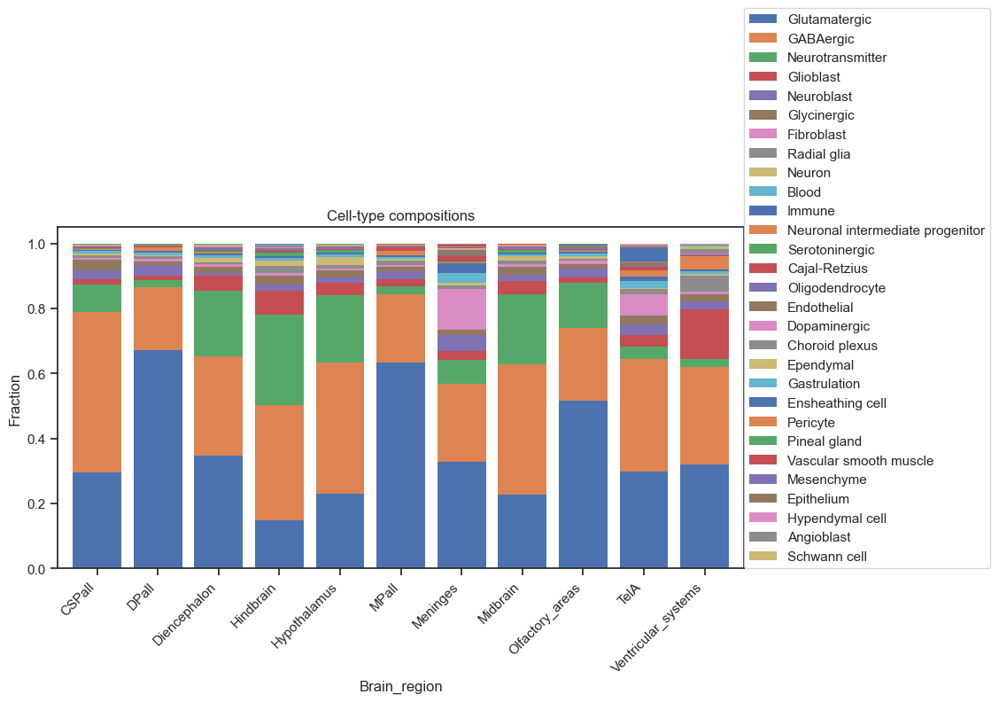

In [23]:
plt.rcParams['figure.figsize']=(10,5)
sns.set(style="ticks", font_scale=1)
df_cell_type_abundence.plot(kind='bar',width=0.8,linewidth =0,
                            stacked=True)#,color=adata.uns['cell_type_colors'])
plt.legend(loc=[1,0])
# labels for x & y axis
#plt.xlabel('Sample')
plt.ylabel('Fraction')
plt.xticks(rotation=45, ha='right', va='top')
# title of plot
plt.title('Cell-type compositions')
plt.show()

In [24]:
df_cell_class_abundence=df_cell_class_abundence.loc[region_index_list[::-1],:]

In [25]:
df_cell_class_abundence

,Neuron,Non-neuronal
Brain_region,,
Hindbrain,0.864523,0.135477
Midbrain,0.913008,0.086992
Meninges,0.739596,0.260404
Hypothalamus,0.922969,0.077031
Diencephalon,0.909865,0.090135
Ventricular_systems,0.739674,0.260326
TelA,0.777097,0.222903
CSPall,0.947667,0.052333
Olfactory_areas,0.936127,0.063873


meta NOT subset; don't know how to subset; dropped


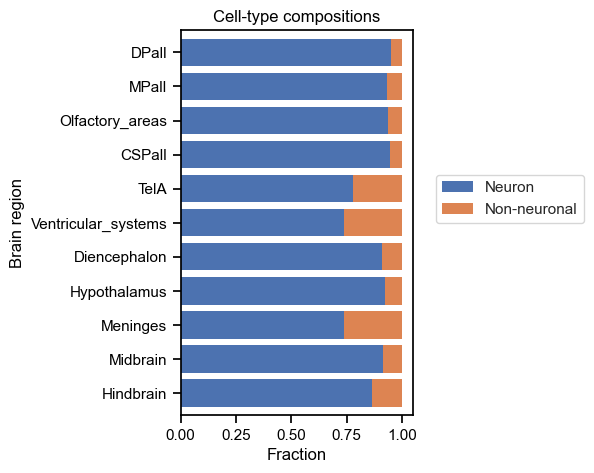

In [26]:
plt.rcParams['figure.figsize']=(3,5)
sns.set(style="ticks", font_scale=1,rc={"axes.edgecolor": "black", "xtick.color": "black", "ytick.color": "black"})
df_cell_class_abundence.plot(kind='barh',width=0.8,linewidth =0,
                            stacked=True)#,color=adata.uns['cell_type_colors'])
plt.legend(loc=[1.1,0.5])
plt.xlabel('Fraction', color='black')  
plt.ylabel("Brain region", color='black')  
plt.title('Cell-type compositions',color='black')  

plt.tick_params(axis='x', colors='black')  
plt.tick_params(axis='y', colors='black') 
plt.show()

### 5.2.1 Neuron

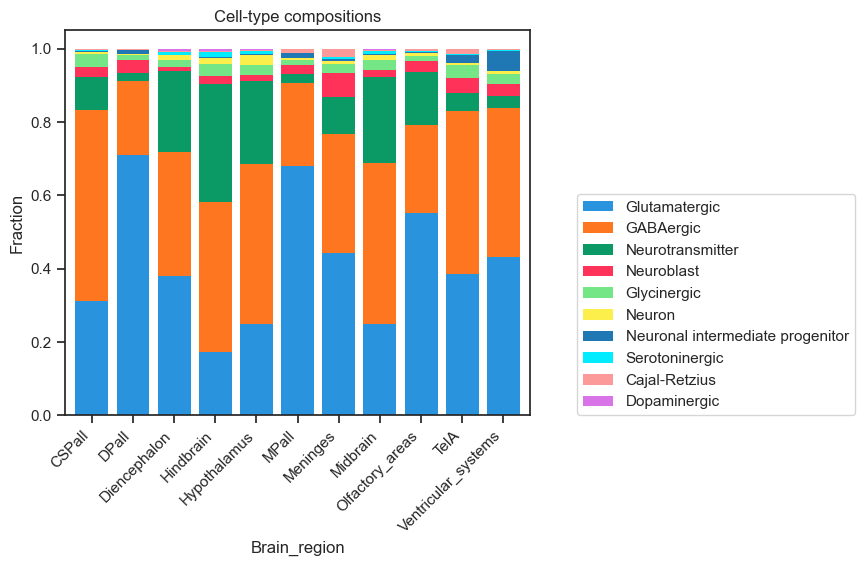

In [27]:
df_cell_anno_Neuron=df_cell_anno[df_cell_anno['cell_class']=='Neuron']
df_cell_abundence_Neuron=df_cell_abundence.loc[df_cell_anno_Neuron.index,:]

df_cell_type_abundence_Neuron=df_cell_abundence_Neuron.groupby(list(df_cell_anno_Neuron['cell_type'])).sum().T
df_cell_type_Neuron_all=pd.DataFrame(df_cell_type_abundence_Neuron.mean(),columns=['abundence'])
df_cell_type_Neuron_all.sort_values(['abundence'],ascending=False,inplace=True)
# Apply the normalising function to each column
df_cell_type_abundence_Neuron=df_cell_type_abundence_Neuron.apply(normalize_col,axis=1)
df_cell_type_abundence_Neuron=df_cell_type_abundence_Neuron.loc[:,list(df_cell_type_Neuron_all.index)]


plt.rcParams['figure.figsize']=(6,5)
sns.set(style="ticks", font_scale=1)
df_cell_type_abundence_Neuron.plot(kind='bar',width=0.8,linewidth =0,
                            stacked=True,color = ['#2a93dd', '#fe7620', '#0b9965', '#ff3359', '#74e685',
          '#fcef4b', '#1f78b4', '#01ecff', '#fb9a99', '#d974e8'])
plt.legend(loc=[1.1,0])
# labels for x & y axis
#plt.xlabel('Sample')
plt.ylabel('Fraction')
plt.xticks(rotation=45, ha='right', va='top')
# title of plot
plt.title('Cell-type compositions')
plt.show()

meta NOT subset; don't know how to subset; dropped


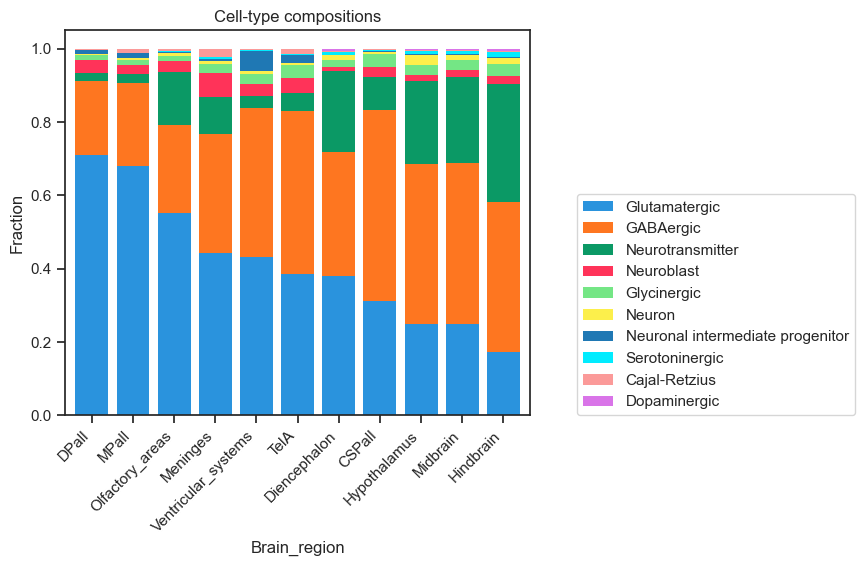

In [28]:
df_cell_anno_Neuron=df_cell_anno[df_cell_anno['cell_class']=='Neuron']
df_cell_abundence_Neuron=df_cell_abundence.loc[df_cell_anno_Neuron.index,:]

df_cell_type_abundence_Neuron=df_cell_abundence_Neuron.groupby(list(df_cell_anno_Neuron['cell_type'])).sum().T
df_cell_type_Neuron_all=pd.DataFrame(df_cell_type_abundence_Neuron.mean(),columns=['abundence'])
df_cell_type_Neuron_all.sort_values(['abundence'],ascending=False,inplace=True)
# Apply the normalising function to each column
df_cell_type_abundence_Neuron=df_cell_type_abundence_Neuron.apply(normalize_col,axis=1)
df_cell_type_abundence_Neuron=df_cell_type_abundence_Neuron.loc[:,list(df_cell_type_Neuron_all.index)]


plt.rcParams['figure.figsize']=(6,5)
sns.set(style="ticks", font_scale=1)
df_cell_type_abundence_Neuron.sort_values('Glutamatergic',ascending=False).plot(kind='bar',width=0.8,linewidth =0,
                            stacked=True,color = ['#2a93dd', '#fe7620', '#0b9965', '#ff3359', '#74e685',
          '#fcef4b', '#1f78b4', '#01ecff', '#fb9a99', '#d974e8'])
plt.legend(loc=[1.1,0])
# labels for x & y axis
#plt.xlabel('Sample')
plt.ylabel('Fraction')
plt.xticks(rotation=45, ha='right', va='top')
# title of plot
plt.title('Cell-type compositions')
plt.show()

#### Sankey diagram-Neuron

In [29]:
def hex2rgba(hex_str,o=0.5):
    h = hex_str.lstrip('#')
    rgb = tuple(int(h[i:i+2], 16) for i in (0, 2, 4))
    r,g,b=rgb
    rgb='rgba('+str(r)+','+str(g)+','+str(b)+','+str(o)+')'
    return rgb

df4.index=df4['Region4']

region=['CSPall', 'DPall', 
        'Diencephalon', 
        'Hindbrain', 
        'Hypothalamus', 
        'MPall', 'Meninges',
        'Midbrain', 
        'Olfactory_areas', 
        'TelA', 
        'Ventricular_systems']


region_color={
    'Forebrain':'#c86a39',
    'Midbrain1':'#2ca02c',
    'Midbrain2':'#2ca02c',
    'Hindbrain1':'#e377c2',
    'Hindbrain2':'#e377c2',
    'Meninges1':'#8da0cb',
    'Meninges2':'#8da0cb',
 'Secondary_prosencephalon':'#e28526',
     'Diencephalon2': '#8c564b',
 'CSPall': '#1f77b4',
 'DPall': '#9467bd',
 'Diencephalon': '#8c564b',
 'Hindbrain': '#e377c2',
 'Hypothalamus': '#bcbd22',
 'MPall': '#12d9b9',
 'Meninges': '#8da0cb',
 'Midbrain': '#2ca02c',
 'Olfactory_areas': '#9c9ede',
 'TelA': '#fb8072',
 'Ventricular_systems': '#999999'}

cell=['Glutamatergic',
 'GABAergic',
 'Neurotransmitter',
 'Neuroblast',
 'Glycinergic',
 'Neuron',
 'Neuronal intermediate progenitor',
 'Cajal-Retzius',
 'Serotoninergic',
 'Dopaminergic']

cell_color={'Glutamatergic': '#2a93dd',
 'GABAergic': '#fe7620',
 'Neurotransmitter': '#0b9965',
 'Neuroblast': '#ff3359',
 'Glycinergic': '#74e685',
 'Neuron': '#fcef4b',
 'Neuronal intermediate progenitor': '#1f78b4',
 'Cajal-Retzius': '#01ecff',
 'Serotoninergic': '#fb9a99',
 'Dopaminergic': '#d974e8'}

label=list(region_color.keys())+list(cell_color.keys())
label_color=list(region_color.values())+list(cell_color.values())
label_color=[hex2rgba(i,0.8) for i in label_color]

In [30]:
plot_dict={}
source=[]
target=[]
value=[]
label_link=[]
color=[]

for i in range(df2.shape[0]):
    r1=df2['Region1'][i]
    r2=df2['Region2'][i]
    v=df2['count'][i]
    source.append(label.index(r1))
    target.append(label.index(r2))
    value.append(v)
    label_link.append(' ')
    color.append(hex2rgba(region_color[r1],0.9))

for i in range(df3.shape[0]):
    r1=df3['Region2'][i]
    r2=df3['Region3'][i]
    v=df3['count'][i]
    source.append(label.index(r1))
    target.append(label.index(r2))
    value.append(v)
    label_link.append(' ')
    color.append(hex2rgba(region_color[r1],0.7))
    
for r in region:
    for c in cell:
        source.append(label.index(r))
        target.append(label.index(c))
        value.append(df4.loc[r,'count']*df_cell_type_abundence_Neuron.loc[r,c])
        label_link.append(' ')
        color.append(hex2rgba(region_color[r],0.5))
        
plot_dict={'node':{'label':label,
                   'color':label_color
                    },
           'link':{'source':source,
                   'target':target,
                   'value':value,
                   'label':label_link,
                   'color':color}
          }

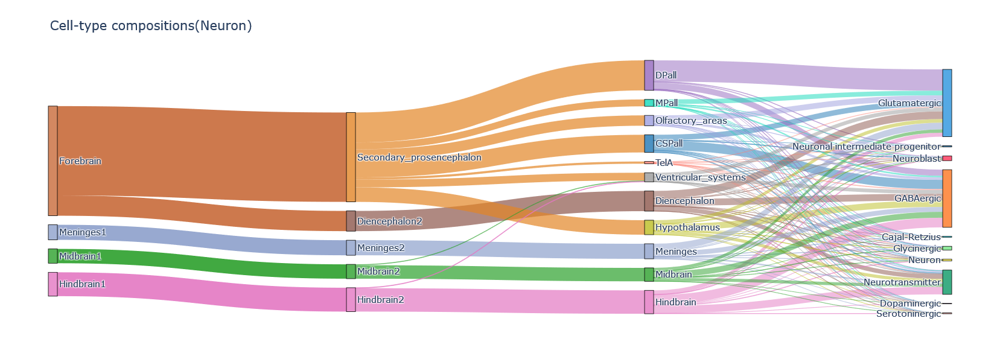

In [31]:
import plotly.graph_objects as go
import urllib, json

fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    # Define nodes
    node = dict(
      pad = 15,#
      thickness = 15,
      line = dict(color = "black", width = 0.8),
      label =  plot_dict['node']['label'],
      color =  plot_dict['node']['color']
    ),
    # Add links
    link = dict(
      source =  plot_dict['link']['source'],
      target =  plot_dict['link']['target'],
      value =  plot_dict['link']['value'],
      label =  plot_dict['link']['label'],
      color =  plot_dict['link']['color']
))])
fig.update_layout(
    width=1200,  
    height=600  
)

fig.update_layout(title_text="Cell-type compositions(Neuron)",
                  font_size=15)
fig.show()

### 5.2.2 Non-neuronal

In [32]:
df_cell_anno_Non=df_cell_anno[df_cell_anno['cell_class']=='Non-neuronal']

df_cell_abundence_Non=df_cell_abundence.loc[df_cell_anno_Non.index,:]

In [33]:
df_cell_type_abundence_Non=df_cell_abundence_Non.groupby(list(df_cell_anno_Non['cell_type'])).sum().T
df_cell_type_Non_all=pd.DataFrame(df_cell_type_abundence_Non.mean(),columns=['abundence'])
df_cell_type_Non_all.sort_values(['abundence'],ascending=False,inplace=True)
# 应用归一化函数到每一列
df_cell_type_abundence_Non=df_cell_type_abundence_Non.apply(normalize_col,axis=1)
df_cell_type_abundence_Non=df_cell_type_abundence_Non.loc[:,list(df_cell_type_Non_all.index)]


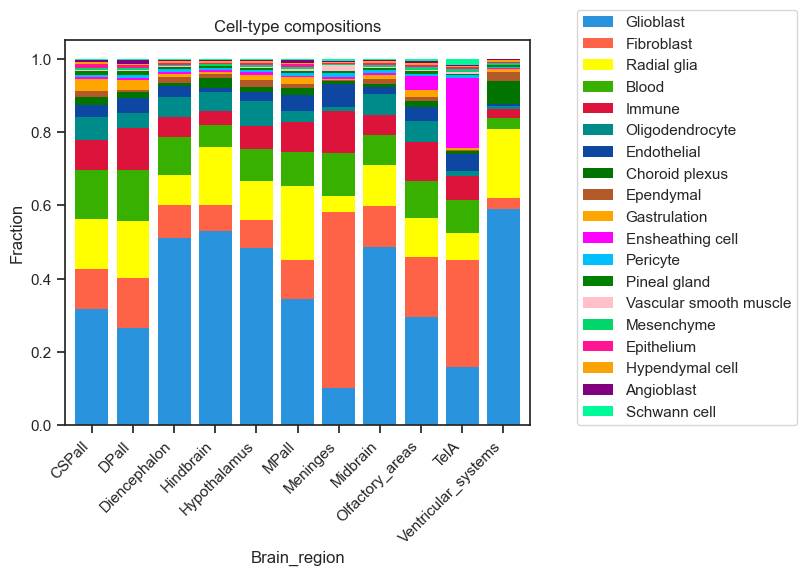

In [34]:
plt.rcParams['figure.figsize']=(6,5)
sns.set(style="ticks", font_scale=1)
df_cell_type_abundence_Non.plot(kind='bar',width=0.8,linewidth =0,
                            stacked=True,color=['#2a93dd', '#FF6347', '#FFFF00', '#38b000', '#DC143C', '#008B8B', '#0d47a1', '#017301', '#b15928',
                                                '#FFA500', '#FF00FF', '#00BFFF', '#008000', '#FFC0CB', '#00d669', '#FF1493', '#f9a306', '#800080', '#00FA9A'])
plt.legend(loc=[1.1,0])
# labels for x & y axis
#plt.xlabel('Sample')
plt.ylabel('Fraction')
plt.xticks(rotation=45, ha='right', va='top')
# title of plot
plt.title('Cell-type compositions')
plt.show()

meta NOT subset; don't know how to subset; dropped


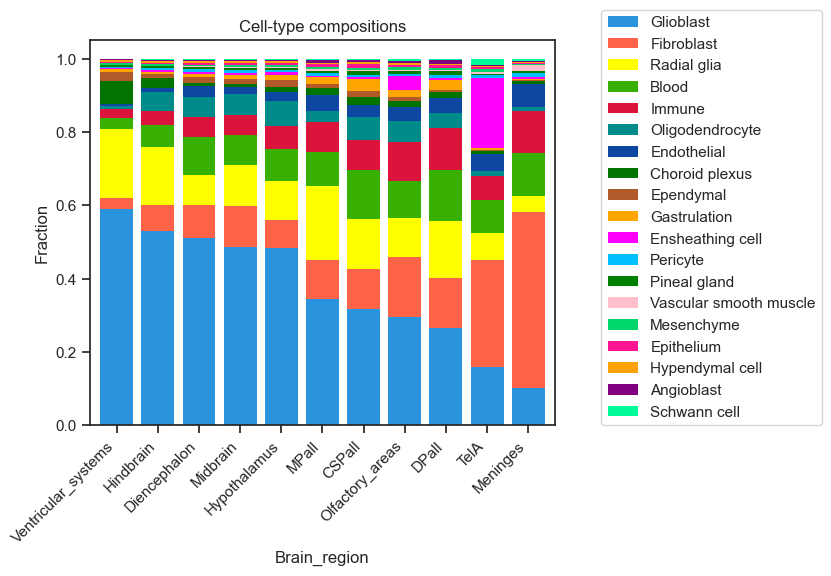

In [35]:
plt.rcParams['figure.figsize']=(6,5)
sns.set(style="ticks", font_scale=1)
df_cell_type_abundence_Non.sort_values('Glioblast',ascending=False).plot(kind='bar',width=0.8,linewidth =0,
                            stacked=True,color=['#2a93dd', '#FF6347', '#FFFF00', '#38b000', '#DC143C', '#008B8B', '#0d47a1', '#017301', '#b15928',
                                                '#FFA500', '#FF00FF', '#00BFFF', '#008000', '#FFC0CB', '#00d669', '#FF1493', '#f9a306', '#800080', '#00FA9A'])
plt.legend(loc=[1.1,0])
# labels for x & y axis
#plt.xlabel('Sample')
plt.ylabel('Fraction')
plt.xticks(rotation=45, ha='right', va='top')
# title of plot
plt.title('Cell-type compositions')
plt.show()

#### Sankey diagram-Non-Neuron

In [36]:
def hex2rgba(hex_str,o=0.5):
    h = hex_str.lstrip('#')
    rgb = tuple(int(h[i:i+2], 16) for i in (0, 2, 4))
    r,g,b=rgb
    rgb='rgba('+str(r)+','+str(g)+','+str(b)+','+str(o)+')'
    return rgb

df4.index=df4['Region4']

region=['CSPall', 'DPall', 
        'Diencephalon', 
        'Hindbrain', 
        'Hypothalamus', 
        'MPall', 'Meninges',
        'Midbrain', 
        'Olfactory_areas', 
        'TelA', 
        'Ventricular_systems']


region_color={
    'Forebrain':'#c86a39',
    'Midbrain1':'#2ca02c',
    'Midbrain2':'#2ca02c',
    'Hindbrain1':'#e377c2',
    'Hindbrain2':'#e377c2',
    'Meninges1':'#8da0cb',
    'Meninges2':'#8da0cb',
 'Secondary_prosencephalon':'#e28526',
     'Diencephalon2': '#8c564b',
 'CSPall': '#1f77b4',
 'DPall': '#9467bd',
 'Diencephalon': '#8c564b',
 'Hindbrain': '#e377c2',
 'Hypothalamus': '#bcbd22',
 'MPall': '#12d9b9',
 'Meninges': '#8da0cb',
 'Midbrain': '#2ca02c',
 'Olfactory_areas': '#9c9ede',
 'TelA': '#fb8072',
 'Ventricular_systems': '#999999'}

cell=['Glioblast',
 'Fibroblast',
 'Radial glia',
 'Blood',
 'Immune',
 'Oligodendrocyte',
 'Endothelial',
 'Choroid plexus',
 'Gastrulation',
 'Ependymal',
 'Ensheathing cell',
 'Pericyte',
 'Pineal gland',
 'Vascular smooth muscle',
 'Mesenchyme',
 'Epithelium',
 'Hypendymal cell',
 'Angioblast',
 'Schwann cell']

cell_color={'Glioblast': '#2a93dd',
 'Fibroblast': '#FF6347',
 'Radial glia': '#FFFF00',
 'Blood': '#38b000',
 'Immune': '#DC143C',
 'Oligodendrocyte': '#008B8B',
 'Endothelial': '#0d47a1',
 'Choroid plexus': '#017301',
 'Gastrulation': '#b15928',
 'Ependymal': '#FFA500',
 'Ensheathing cell': '#FF00FF',
 'Pericyte': '#00BFFF',
 'Pineal gland': '#008000',
 'Vascular smooth muscle': '#FFC0CB',
 'Mesenchyme': '#00d669',
 'Epithelium': '#FF1493',
 'Hypendymal cell': '#f9a306',
 'Angioblast': '#800080',
 'Schwann cell': '#00FA9A'}

label=list(region_color.keys())+list(cell_color.keys())
label_color=list(region_color.values())+list(cell_color.values())
label_color=[hex2rgba(i,0.8) for i in label_color]

In [37]:
plot_dict={}
source=[]
target=[]
value=[]
label_link=[]
color=[]

for i in range(df2.shape[0]):
    r1=df2['Region1'][i]
    r2=df2['Region2'][i]
    v=df2['count'][i]
    source.append(label.index(r1))
    target.append(label.index(r2))
    value.append(v)
    label_link.append(' ')
    color.append(hex2rgba(region_color[r1],0.9))

for i in range(df3.shape[0]):
    r1=df3['Region2'][i]
    r2=df3['Region3'][i]
    v=df3['count'][i]
    source.append(label.index(r1))
    target.append(label.index(r2))
    value.append(v)
    label_link.append(' ')
    color.append(hex2rgba(region_color[r1],0.7))
    
for r in region:
    for c in cell:
        source.append(label.index(r))
        target.append(label.index(c))
        value.append(df4.loc[r,'count']*df_cell_type_abundence_Non.loc[r,c])
        label_link.append(' ')
        color.append(hex2rgba(region_color[r],0.5))
        
plot_dict={'node':{'label':label,
                   'color':label_color
                    },
           'link':{'source':source,
                   'target':target,
                   'value':value,
                   'label':label_link,
                   'color':color}
          }

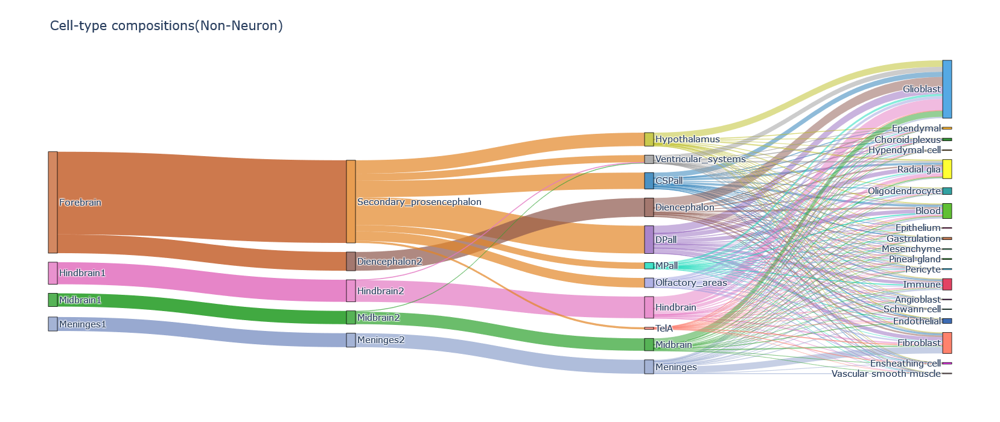

In [38]:
import plotly.graph_objects as go
import urllib, json

fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      #size=10,
      line = dict(color = "black", width = 0.8),
      label =  plot_dict['node']['label'],
      color =  plot_dict['node']['color'],
    ),
    # Add links
    link = dict(
      source =  plot_dict['link']['source'],
      target =  plot_dict['link']['target'],
      value =  plot_dict['link']['value'],
      label =  plot_dict['link']['label'],
      color =  plot_dict['link']['color']
))])


fig.update_layout(
    width=1200,  
    height=700  
)

fig.update_layout(title_text="Cell-type compositions(Non-Neuron)",
                  font_size=15)

fig.show()

# Fig5 Heatmap of cell type abundance in brain regions

In [2]:
adata_cell=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_cell.h5ad')
df_cell_anno=pd.read_csv('cell_annotation.csv',index_col=0)
df_cell_anno=df_cell_anno.loc[list(adata_cell.var_names),:]

df_adata_cell=pd.DataFrame(adata_cell.X.A,index=adata_cell.obs_names,columns=adata_cell.var_names).T.groupby(list(df_cell_anno['cell_type'])).sum().T.loc[adata_cell.obs_names,:]
df_cell_anno=df_cell_anno.drop_duplicates(['cell_type'])
df_cell_anno.index=list(df_cell_anno['cell_type'])
df_cell_anno=df_cell_anno.loc[list(df_adata_cell.columns),:]

In [3]:

adata_cell_type = AnnData(df_adata_cell, obs=adata_cell.obs, var=df_cell_anno,
                          obsm={"spatial": adata_cell.obsm['spatial'],
                                "spatial_3d_align": adata_cell.obsm['spatial_3d_align']})



In [4]:
sc.tl.rank_genes_groups(adata_cell_type, groupby='region', method='wilcoxon',use_raw =False)
sc.tl.filter_rank_genes_groups(adata_cell_type)

In [5]:
adata_cell_type.layers['raw']=adata_cell_type.X.copy()

In [6]:
adata_cell_type.X=adata_cell_type.layers['raw'].copy()
def trans_p99(x):
    x=np.array(x,dtype=np.float32)
    x[x>np.nanpercentile(x, 99)]=np.nanpercentile(x, 99)
    return x
a=np.array(pd.DataFrame(adata_cell_type.X).apply(trans_p99,axis=0)) 
adata_cell_type.X[0:,0:]=a[0:,0:]

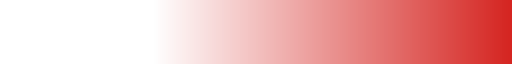

In [7]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
nodes = [0, 0.3,1.0]
colors=['#ffffff', '#ffffff','#d52521']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap

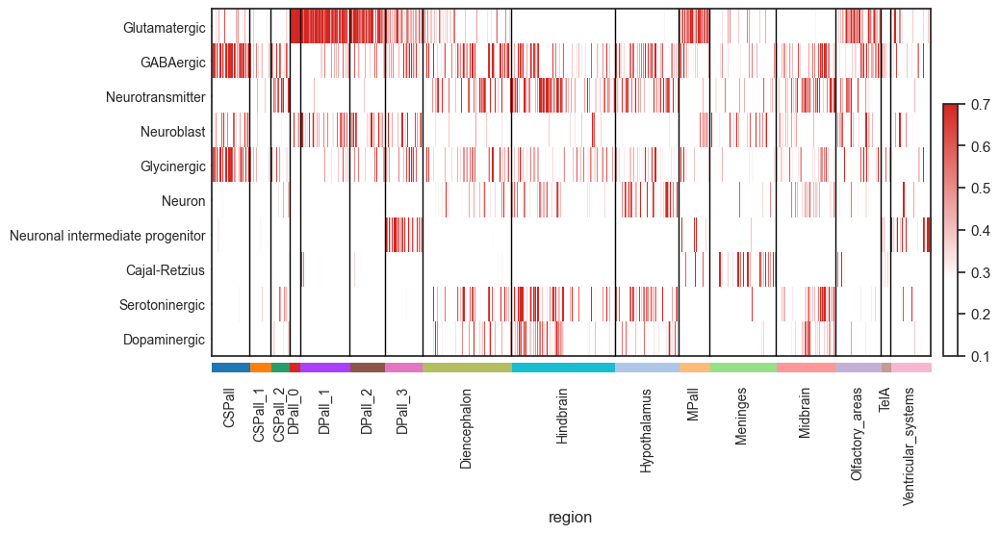

<Figure size 640x480 with 0 Axes>

In [8]:

cell=['Glutamatergic',
 'GABAergic',
 'Neurotransmitter',
 'Neuroblast',
 'Glycinergic',
 'Neuron',
 'Neuronal intermediate progenitor',
 'Cajal-Retzius',
 'Serotoninergic',
 'Dopaminergic']
cell_Non=['Glioblast',
 'Fibroblast',
 'Radial glia',
 'Blood',
 'Immune',
 'Oligodendrocyte',
 'Endothelial',
 'Choroid plexus',
 'Gastrulation',
 'Ependymal',
 'Ensheathing cell',
 'Pericyte',
 'Pineal gland',
 'Vascular smooth muscle',
 'Mesenchyme',
 'Epithelium',
 'Hypendymal cell',
 'Angioblast',
 'Schwann cell']

sns.set(style="ticks", font_scale=1)
sc.pl.heatmap(adata_cell_type, var_names=cell, groupby='region',
               cmap=cmap,
              dendrogram=False,
            figsize=(10,5),standard_scale='var',
            vmin=0.1,vmax=0.7,
            use_raw=False,swap_axes =True,
             )


meta NOT subset; don't know how to subset; dropped


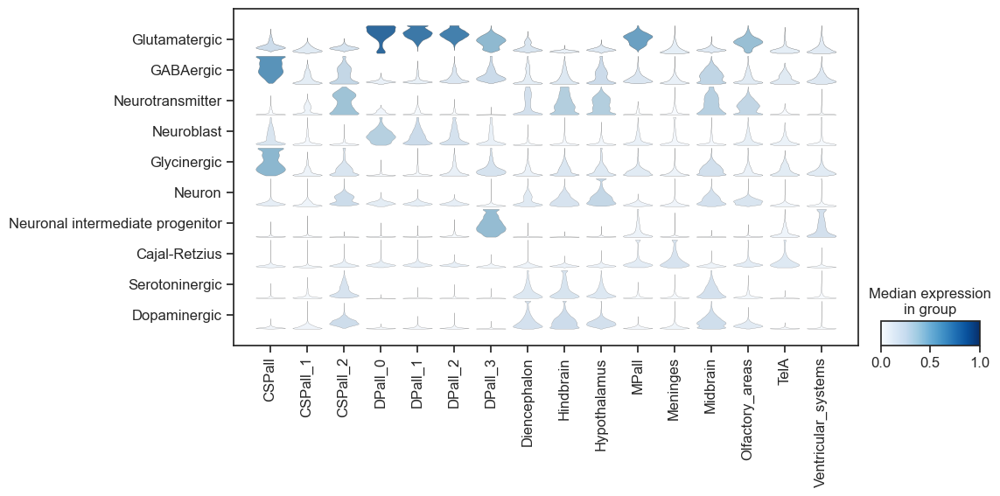

In [14]:
sns.set(style="ticks", font_scale=1.2)
sc.pl.stacked_violin(adata_cell_type, cell,groupby=['region'],vmin=0,vmax=1,
              standard_scale='var',figsize=(11,5),swap_axes =True,
              dendrogram=False,
                    show=False)

meta NOT subset; don't know how to subset; dropped


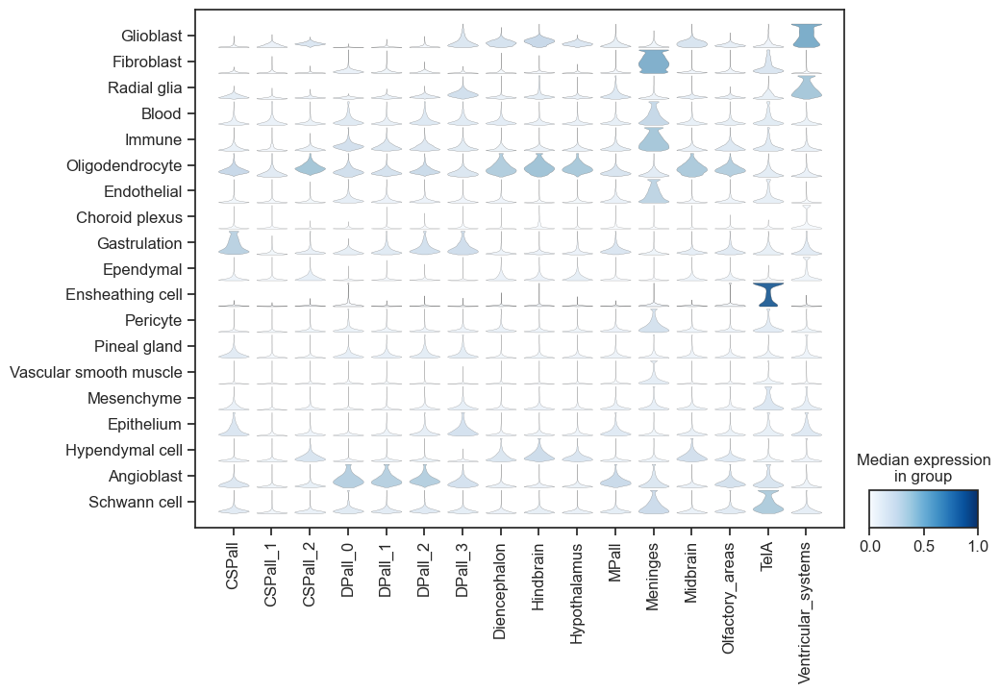

In [15]:
sns.set(style="ticks", font_scale=1.2)
sc.pl.stacked_violin(adata_cell_type, cell_Non,groupby=['region'],vmin=0,vmax=1,
              standard_scale='var',figsize=(10.5,7),swap_axes =True,
              dendrogram=False,
                    show=False)

# Fig5-B-Gene UMI number

In [2]:
adata_3d=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_harmony.h5ad')

In [3]:
adata_3d.X=adata_3d.layers['raw']

In [4]:
assignedName = {'CSPall':'CSPall',
 'CSPall_1':'CSPall',
 'CSPall_2':'CSPall',
 'DPall_0':'DPall',
 'DPall_1':'DPall',
 'DPall_2':'DPall',
 'DPall_3':'DPall',
 'Diencephalon':'Diencephalon',
 'Hindbrain':'Hindbrain',
 'Hypothalamus':'Hypothalamus',
 'MPall':'MPall',
 'Meninges':'Meninges',
 'Midbrain':'Midbrain',
 'Olfactory_areas':'Olfactory_areas',
 'TelA':'TelA',
 'Ventricular_systems':'Ventricular_systems'}
adata_3d.obs['Brain_region'] = (adata_3d.obs['region'].map(assignedName).astype('category'))

In [5]:
adata_3d.var["mt"] = adata_3d.var.Symbol.str.startswith("mt-")
adata_3d.var['rp'] = adata_3d.var.type.str.startswith("rRNA")
sc.pp.calculate_qc_metrics(adata_3d, qc_vars=["mt","rp"], inplace=True)

In [8]:
df = adata_3d.obs[["Brain_region","n_genes_by_counts",'total_counts']]

In [11]:
from collections import Counter
pd.DataFrame(pd.Series(dict(Counter(list(df['Brain_region'])))),columns=['value'])

,value
TelA,1327
Olfactory_areas,6219
DPall,18021
Ventricular_systems,5477
Meninges,9052
CSPall,10618
Hypothalamus,8699
MPall,4136
Diencephalon,12155
Midbrain,8069


meta NOT subset; don't know how to subset; dropped


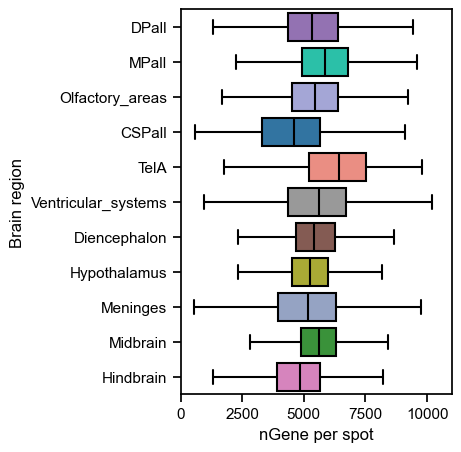

In [71]:
region_color={
 'CSPall': '#1f77b4',
 'DPall': '#9467bd',
 'Diencephalon': '#8c564b',
 'Hindbrain': '#e377c2',
 'Hypothalamus': '#bcbd22',
 'MPall': '#12d9b9',
 'Meninges': '#8da0cb',
 'Midbrain': '#2ca02c',
 'Olfactory_areas': '#9c9ede',
 'TelA': '#fb8072',
 'Ventricular_systems': '#999999'}
import seaborn as sns
plt.figure(figsize=(3.5,5))
sns.set_theme(style="ticks", palette="pastel",rc={"axes.edgecolor": "black", "xtick.color": "black", "ytick.color": "black"})
ax=sns.boxplot(y="Brain_region", x="n_genes_by_counts",fliersize=0,
            palette=region_color,
            boxprops=dict(edgecolor='black'),
            medianprops=dict(color='black'), 
            capprops=dict(color='black'),
            whiskerprops=dict(color='black'),
            order=region_index_list,
            data=adata_3d.obs)
plt.xlim(0,11000)
plt.tick_params(colors='black')
ax.tick_params(axis='x', colors='black')  
ax.tick_params(axis='y', colors='black')  
plt.xlabel("nGene per spot", color='black')  
plt.ylabel("Brain region", color='black')  


meta NOT subset; don't know how to subset; dropped


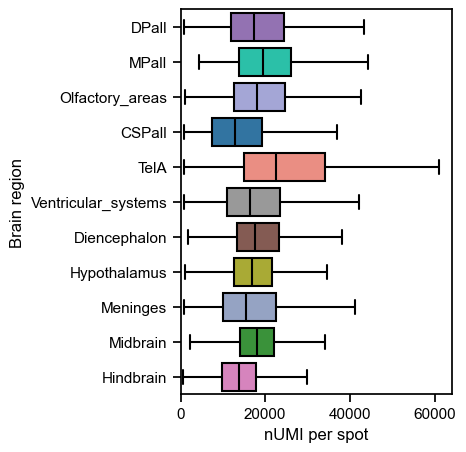

In [72]:
import seaborn as sns
plt.figure(figsize=(3.5,5))
sns.set_theme(style="ticks", palette="pastel",rc={"axes.edgecolor": "black", "xtick.color": "black", "ytick.color": "black"})
ax=sns.boxplot(y="Brain_region", x="total_counts",fliersize=0,
            palette=region_color,
            boxprops=dict(edgecolor='black'),
            medianprops=dict(color='black'), 
            capprops=dict(color='black'),
            whiskerprops=dict(color='black'),
            order=region_index_list,
            data=adata_3d.obs)
plt.xlim(0,64000)
plt.tick_params(colors='black')
ax.tick_params(axis='x', colors='black')  
ax.tick_params(axis='y', colors='black')  
plt.xlabel("nUMI per spot", color='black')  
plt.ylabel("Brain region", color='black')  


# Fig5  marker gene

In [2]:
adata_3d_filtered=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_harmony.h5ad')


In [4]:
adata_3d_filtered.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_3d_filtered, groupby='region', method='wilcoxon',use_raw =False)


In [5]:
sc.tl.filter_rank_genes_groups(adata_3d_filtered)

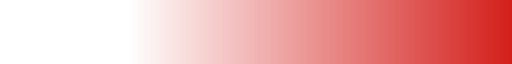

In [14]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
nodes = [0, 0.25,1.0]
colors=['white', 'white','#d4201c']
cmap = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap

meta NOT subset; don't know how to subset; dropped


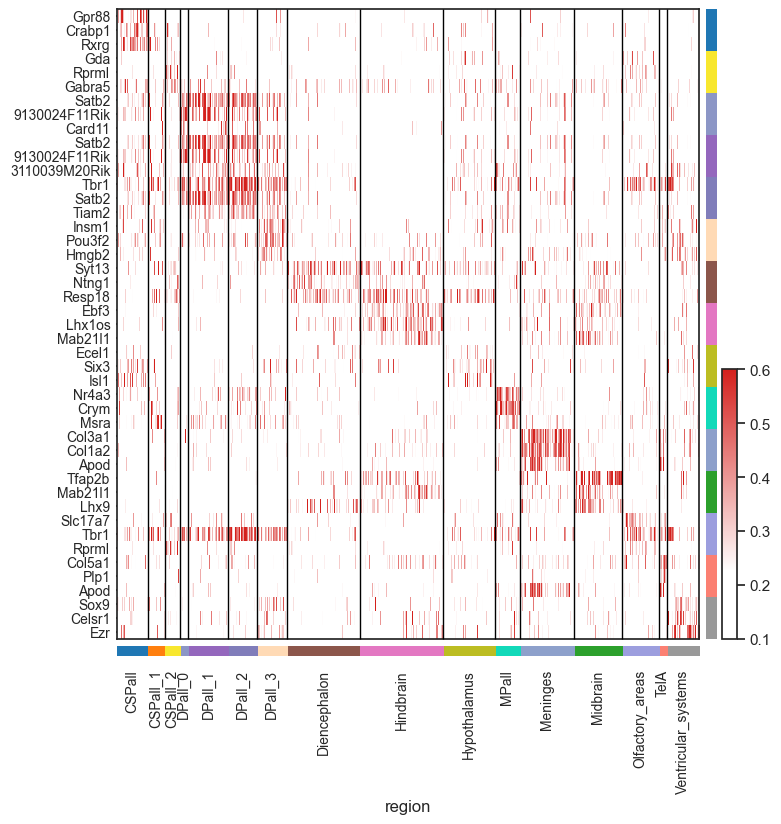

In [104]:
sc.pl.rank_genes_groups_heatmap(adata_3d_filtered,n_genes=3,gene_symbols='Symbol',
                                key='rank_genes_groups_filtered',
                                swap_axes=True,
                                cmap=cmap, dendrogram=False,
                                figsize=(8,8.5),standard_scale='var',
                                vmin=0.1,vmax=0.6,
                               use_raw=False,
                               show=False)

# Fig、3D Spatial distribution

In [75]:
import open3d as o3d
import pyvista as pv
from pyntcloud import PyntCloud

import trame
import pyvistaqt as pvqt

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
color_list=['#1f77b4','#ff7f0e','#f8e72e','#8c96c6','#9467bd','#807dba','#ffdab5',
            '#8c564b','#e377c2','#bcbd22','#12d9b9',
            '#8da0cb','#2ca02c','#9c9ede','#fb8072','#999999']
def hex2rgb(hex_str):
    h = hex_str.lstrip('#')
    rgb = tuple(int(h[i:i+2], 16) for i in (0, 2, 4))
    r,g,b=rgb
    rgb=(r/255,g/255,b/255)
    return rgb

def plot_3d_spatial(adata,cluster,l_list=None,gene_list=None,cell_list=None,show=False):
    #l_list:region name
    #gene_list: gene name
    
    assignedName={adata.obs[cluster].cat.categories[i] :color_list[i] for  i in range(len(adata.obs[cluster].cat.categories))}
    assignedName_seq={ adata.obs[cluster].cat.categories[i] : i  for i in range(len(adata.obs[cluster].cat.categories))}
    
    adata.obs['color_list'] = adata.obs[cluster].map(assignedName)
    adata.obs['color_seq'] = adata.obs[cluster].map(assignedName_seq)
    
    color=np.array([hex2rgb(i) for i in adata.obs['color_list']])
    color_seq=np.array(adata.obs['color_seq'])
    points=adata.obsm['spatial_3d_align']
    color_pc_tmp=[]
    if l_list is not None:
        color=color[adata.obs[cluster].isin(l_list),:]
        points=points[adata.obs[cluster].isin(l_list),:]
        color_seq=color_seq[adata.obs[cluster].isin(l_list)]

        for r in l_list:
            color_pc_tmp.append(assignedName[r])
            
    pcd_pc_tmp = o3d.geometry.PointCloud()
    pcd_pc_tmp.points = o3d.utility.Vector3dVector(points)
    pcd_pc_tmp.colors = o3d.utility.Vector3dVector(color)
    
    bbox = pcd_pc_tmp.get_axis_aligned_bounding_box()
    bbox.color = (186/255,186/255,186/255)
    if show:
        o3d.visualization.draw_geometries([pcd_pc_tmp,bbox],window_name='Open3D ', width=1200, height=800, left=300, top=150,)
    pv_pc_tmp = PyntCloud.from_instance("open3d", pcd_pc_tmp).to_instance("pyvista", mesh=False)
    pv_pc_tmp['color_seq']=color_seq
    np_gene=None
    np_cell=None
    if l_list is not None:
        if gene_list is not None:
            np_gene=np.zeros((np.sum(adata.obs[cluster].isin(l_list)),len(gene_list)))
            var_gene=list(adata.var['Symbol'])
            n=0
            for gene in gene_list:
                gene_intensity=adata.raw.X[adata.obs[cluster].isin(l_list),var_gene.index( gene )].A.flatten()
                gene_intensity=trans_pN(gene_intensity)
                pv_pc_tmp[gene]=gene_intensity
                np_gene[:,n]=gene_intensity
                n+=1
    else:
        if gene_list is not None:
            np_gene=np.zeros((adata.n_obs,len(gene_list)))
            var_gene=list(adata.var['Symbol'])
            n=0
            for gene in gene_list:
                gene_intensity=adata.raw.X[:,var_gene.index( gene )].A.flatten()
                gene_intensity=trans_pN(gene_intensity)
                pv_pc_tmp[gene]=gene_intensity
                np_gene[:,n]=gene_intensity
                n+=1
                
    if l_list is not None:
        if cell_list is not None:
            np_cell=np.zeros((np.sum(adata.obs[cluster].isin(l_list)),len(cell_list)))
            n=0
            for cell in cell_list:
                cell_intensity=np.array(adata.obs.loc[adata.obs[cluster].isin(l_list),cell]).flatten()
                cell_intensity=trans_pN(cell_intensity)
                pv_pc_tmp[cell]=cell_intensity
                np_cell[:,n]=cell_intensity
                n+=1
    else:
        if cell_list is not None:
            np_cell=np.zeros((adata.n_obs,len(cell_list)))
            n=0
            for cell in cell_list:
                cell_intensity=np.array(adata.obs.loc[:,cell]).flatten()
                cell_intensity=trans_pN(cell_intensity)
                pv_pc_tmp[cell]=cell_intensity
                np_cell[:,n]=cell_intensity
                n+=1
    if np_gene is not None:
        return np_gene,pv_pc_tmp,color_pc_tmp
    elif np_cell is not None:
        return np_cell,pv_pc_tmp,color_pc_tmp
    else:
        return pcd_pc_tmp,pv_pc_tmp,color_pc_tmp


pc_path="../file/Mouse_Embryo_Brain_3D/3D-file/Brain-HE-pv_mesh.vtk"
pv_mesh=pv.read(pc_path)
vertices = np.asarray(pv_mesh.points)# Get vertex coordinates
faces = np.asarray(pv_mesh.faces).reshape(-1, 4)[:, 1:]# Get triangular face index

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [76]:
pc_path="/3D-file/Brain-HE-pc_point-50.vtk"
pv_point=pv.read(pc_path)

In [77]:
import k3d
from k3d.colormaps import matplotlib_color_maps
from  st_processing import trans_pN
df_cell_anno=pd.read_csv('cell_annotation.csv',index_col=0)
adata_3d=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_interpolation.h5ad')
#adata_3d.layers['raw'] = adata_3d.X.copy()
sc.pp.normalize_total(adata_3d,target_sum=1e4)
adata_3d.raw = adata_3d.copy()
sc.pp.log1p(adata_3d)

df_cell_anno=df_cell_anno.loc[adata_3d.obs.columns[11:],:]
df_cell=adata_3d.obs.iloc[:,11:].T
df_cell['cell_type']=df_cell_anno['cell_type']
df_cell=df_cell.groupby(['cell_type']).sum().T
adata_3d.obs=pd.concat( [adata_3d.obs,df_cell],axis=1)


In [78]:
del df_cell_anno
del df_cell

In [79]:
plt_points = k3d.points(positions=np.array(pv_point.points),
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=0.1,
                        color =4079166,
                        #attribute=f,
                        #color_map=matplotlib_color_maps.Coolwarm,
                        #color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.25)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()

Output()

In [80]:
color_list=['#1f77b4','#ff7f0e','#f8e72e','#8c96c6','#9467bd','#807dba','#ffdab5',
            '#8c564b','#e377c2','#bcbd22','#12d9b9',
            '#8da0cb','#2ca02c','#9c9ede','#fb8072','#999999']

In [81]:
region=['CSPall',
 'CSPall_1',
 'CSPall_2',
 'DPall_0',
 'DPall_1',
 'DPall_2',
 'DPall_3',
 'Diencephalon',
 'Hindbrain',
 'Hypothalamus',
 'MPall',
 'Meninges',
 'Midbrain',
 'Olfactory_areas',
 'TelA',
 'Ventricular_systems']

In [82]:
d=adata_3d.obs.loc[:,['region','color_list']].drop_duplicates()
region_color = dict(zip(region, color_list))
region_color

{'CSPall': '#1f77b4',
 'CSPall_1': '#ff7f0e',
 'CSPall_2': '#f8e72e',
 'DPall_0': '#8c96c6',
 'DPall_1': '#9467bd',
 'DPall_2': '#807dba',
 'DPall_3': '#ffdab5',
 'Diencephalon': '#8c564b',
 'Hindbrain': '#e377c2',
 'Hypothalamus': '#bcbd22',
 'MPall': '#12d9b9',
 'Meninges': '#8da0cb',
 'Midbrain': '#2ca02c',
 'Olfactory_areas': '#9c9ede',
 'TelA': '#fb8072',
 'Ventricular_systems': '#999999'}

## 6.1 View brain regions

### pyvista-region

In [43]:
import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.2
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter(shape=(3,3))

pl.subplot(0,0)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['DPall_0','DPall_1','DPall_2','DPall_3'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#9467bc'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.subplot(0,1)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['Midbrain'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#2b9f2b'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)


pl.subplot(0,2)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['Hindbrain'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#e277c1'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)


pl.subplot(1,0)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['MPall'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#11d8b8'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.subplot(1,1)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['CSPall'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#1e76b3'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.subplot(2,2)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['Diencephalon'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#8b554a'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)
pl.subplot(2,0)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['Hypothalamus'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#bbbc22'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)
pl.subplot(2,1)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['DPall_3'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#ffba77'
             #cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.subplot(1,2)
pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=['Olfactory_areas'],show=False)
pl.add_points(pv_pc_select,
              point_size=2,
              color='#9b9ddd'
             #cmap=color_pc_tmp,
             )

pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.view_isometric()
#pl.show(jupyter_backend='trame')

### All brain area

In [545]:
region_list=list(set(adata_3d.obs['region']))
region_list.sort()
region_list

['CSPall',
 'CSPall_1',
 'CSPall_2',
 'DPall_0',
 'DPall_1',
 'DPall_2',
 'DPall_3',
 'Diencephalon',
 'Hindbrain',
 'Hypothalamus',
 'MPall',
 'Meninges',
 'Midbrain',
 'Olfactory_areas',
 'TelA',
 'Ventricular_systems']

In [546]:
import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.15
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter()

pcd_pc_select,pv_pc_select,color_pc_tmp =plot_3d_spatial(adata_3d,
                                                         'region',l_list=region_list,show=False)
pl.add_points(pv_pc_select,
              point_size=3,
              #color='#9467bc'
              scalars='color_seq',
             cmap=color_pc_tmp,
             )
pl.add_mesh(pv_mesh,
            opacity=o,
            show_edges=s,
            edge_color=c)

pl.view_isometric()
#pl.show()

### K3D-region

In [8]:
def hex_to_int_color(hex_color):
    int_color = int(hex_color.lstrip('#'), 16)  
    return int_color
x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = list(adata_3d.obs.loc[:,'region'])
c=[region_color[i] for i in f ]
color_int=np.array([hex_to_int_color(i) for i in c])

In [9]:

plt_points = k3d.points(positions=x,
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors =color_int,
                        #attribute=f,
                        #color_map=matplotlib_color_maps.Coolwarm,
                        #color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot()
plot += plt_points
plot += mesh
plot.display()

Output()

In [11]:
hex_to_int_color('#3e3e3e')

4079166

## 6.2查看gene

### pyvista-gene

In [48]:
def trans_pN(x):
    x=np.array(x,dtype=np.float32)
    P_99=np.nanpercentile(x, 99)
    P_1=np.nanpercentile(x, 5)
    x[x>P_99]=P_99
    x[x<P_1]=P_1
    return x 
    
nodes = [0, 0.5,1.0]
# d=adata_3d.obs.loc[:,['color_seq','color_list']].drop_duplicates()
# d = dict(zip(d['color_seq'], d['color_list']))


In [50]:
import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.15
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter()

g='Slc17a7'
colors=['#ffffff', '#ffffff','#9467bc']
colors=['#f2edf7', '#f2edf7','#9467bc']
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
np_gene,pv_pc_select,_ = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               #l_list=['DPall_0','DPall_1','DPall_2'],
                                               gene_list=[g])
pl.add_points(pv_pc_select,
              point_size=2,
              #opacity=0.8,
              scalars=g,
             cmap=cmap1,
              clim=[0,1]
             )


pl.add_mesh(pv_mesh,
            opacity=0.1,
            show_edges=s,
            edge_color=c)
pl.view_isometric()
#pl.show()

### K3D-gene

In [51]:
def trans_pN(x):
    x=np.array(x,dtype=np.float32)
    P_99=np.nanpercentile(x, 99)
    P_1=np.nanpercentile(x, 5)
    x[x>P_99]=P_99
    x[x<P_1]=P_1
    return x 
var_gene=list(adata_3d.var['Symbol'])

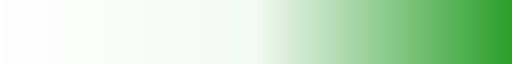

In [52]:
gene='Slc17a7'
nodes = [0, 0.5,1.0]
colors=['#ffffff', '#f4faf4','#2b9f2b']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = adata_3d.raw.X.A[:,var_gene.index(gene)]#np.array(adata_cell.obs['color_seq'])

cmap

In [54]:
plt_points = k3d.points(positions=x,
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        #color =list(set(adata_cell.obs['color_list'])),#d,#matplotlib_color_maps.Coolwarm,
                        attribute=f,
                        color_map=cmap_array,
                        color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)

plot += plt_points
plot += mesh
plot.display()

Output()

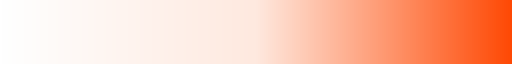

In [58]:
gene='Slc17a6'
nodes = [0, 0.5,1.0]
colors=['#ffffff', '#fee9df','#fe4905']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = adata_3d.raw.X.A[:,var_gene.index(gene)]#np.array(adata_cell.obs['color_seq'])

cmap

In [59]:
plt_points = k3d.points(positions=x,
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        #color =list(set(adata_cell.obs['color_list'])),#d,#matplotlib_color_maps.Coolwarm,
                        attribute=f,
                        color_map=cmap_array,
                        color_range=[0, 2]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)

plot += plt_points
plot += mesh
plot.display()

Output()

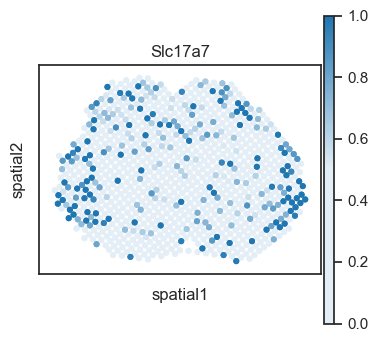

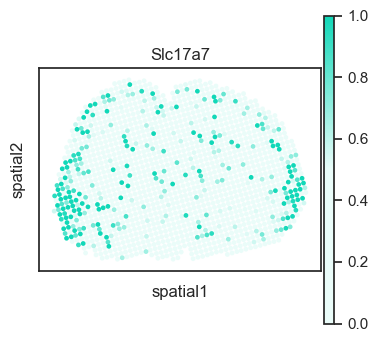

In [264]:
adata_st=adata_3d[adata_3d.obs['sample']=='8-3']
g='Slc17a7'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#e4eef6', '#e4eef6','#1e76b3']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=1,
               #crop_coord= [-10,686,-10,686],
             show=True)

adata_st=adata_3d[adata_3d.obs['sample']=='10-2']
g='Slc17a7'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#eafcf9', '#eafcf9','#11d8b8']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=1,
               #crop_coord= [-10,686,-10,686],
             show=True)

In [18]:
gene=['Foxp1','Nr4a3']

l_dict={gene[0]:['CSPall'],
       gene[1]:['MPall']}

i=0
nodes = [0, 0.5,1.0]
colors=['#e4eef6', '#e4eef6','#1e76b3']
cmap0=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap0.N, 256)):
    r, g, b = cmap0(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array0=np.array(cmap_list)
x0 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f0 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])

i=1
nodes = [0, 0.5,1.0]
colors=['#eafcf9', '#eafcf9','#11d8b8']
cmap1=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap1.N, 256)):
    r, g, b = cmap1(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array1=np.array(cmap_list)

x1 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f1 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])


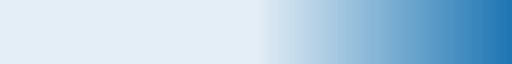

In [19]:
cmap0

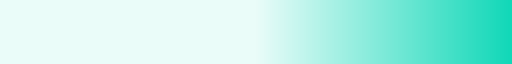

In [20]:
cmap1

In [21]:
plt_points0 = k3d.points(positions=x0,point_size=6,shader='flat',opacity=1,attribute=f0,color_map=cmap_array0,
                        color_range=[0, 5])
plt_points1 = k3d.points(positions=x1,point_size=6,shader='flat',opacity=1,attribute=f1,color_map=cmap_array1,
                        color_range=[0, 3])

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points0
plot += plt_points1
plot += mesh
plot.display()

Output()

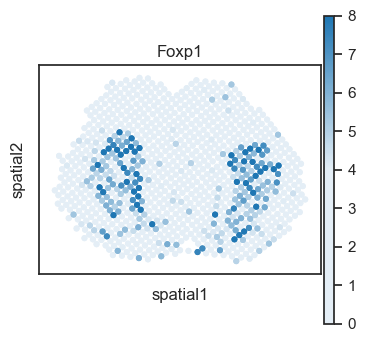

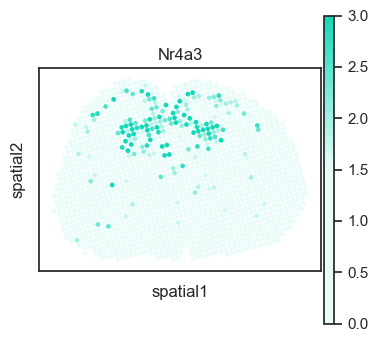

In [22]:
adata_st=adata_3d[adata_3d.obs['sample']=='8-3']
g='Foxp1'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#e4eef6', '#e4eef6','#1e76b3']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=8,
               #crop_coord= [-10,686,-10,686],
             show=True)

adata_st=adata_3d[adata_3d.obs['sample']=='10-2']
g='Nr4a3'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#eafcf9', '#eafcf9','#11d8b8']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=3,
               #crop_coord= [-10,686,-10,686],
             show=True)

In [23]:
gene=['Satb2','Tfap2b']
l_dict={gene[0]:['DPall_0','DPall_1','DPall_2'],
       gene[1]:['Midbrain']}

i=0
nodes = [0, 0.5,1.0]
colors=['#f2edf7', '#f2edf7','#9467bc']
cmap0=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap0.N, 256)):
    r, g, b = cmap0(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array0=np.array(cmap_list)
x0 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f0 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])

i=1
nodes = [0, 0.5,1.0]
colors=['#e1f1e1', '#e1f1e1','#2b9f2b']
cmap1=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap1.N, 256)):
    r, g, b = cmap1(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array1=np.array(cmap_list)

x1 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f1 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])


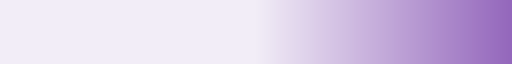

In [24]:
cmap0

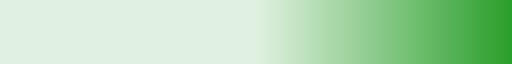

In [25]:
cmap1

In [26]:
plt_points0 = k3d.points(positions=x0,point_size=6,shader='flat',opacity=1,attribute=f0,color_map=cmap_array0,
                        color_range=[0, 5])
plt_points1 = k3d.points(positions=x1,point_size=6,shader='flat',opacity=1,attribute=f1,color_map=cmap_array1,
                        color_range=[0, 8])

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points0
plot += plt_points1
plot += mesh
plot.display()

Output()

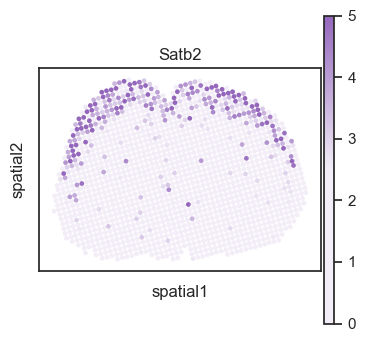

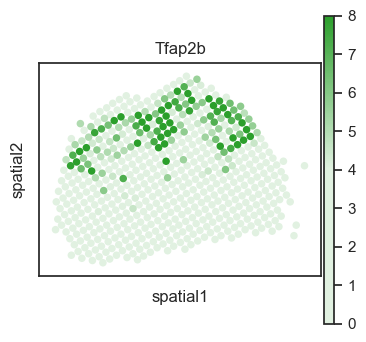

In [27]:
adata_st=adata_3d[adata_3d.obs['sample']=='10-2']
g='Satb2'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#f2edf7', '#f2edf7','#9467bc']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=5,
               #crop_coord= [-10,686,-10,686],
             show=True)

adata_st=adata_3d[adata_3d.obs['sample']=='17-9']
g='Tfap2b'
plt.rcParams['figure.figsize']=(4,4)
sns.set(style="ticks", font_scale=1)
colors=['#e1f1e1', '#e1f1e1','#2b9f2b']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=[g], cmap=cmap5, palette=color_list,  vmin=0,vmax=8,
               #crop_coord= [-10,686,-10,686],
             show=True)



In [35]:
gene=['Slc17a7','Insm1','Ecel1']
l_dict={gene[0]:['Olfactory_areas'],
       gene[1]:['DPall_3'],
       gene[2]:['Hypothalamus']}

i=0
nodes = [0, 0.5,1.0]
colors=['#f1f2fa', '#f1f2fa','#9c9ede']
cmap0=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap0.N, 256)):
    r, g, b = cmap0(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array0=np.array(cmap_list)
x0 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f0 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])

i=1
nodes = [0, 0.5,1.0]
colors=['#fffbf6', '#fffbf6','#ffdab5']
cmap1=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap1.N, 256)):
    r, g, b = cmap1(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array1=np.array(cmap_list)

x1 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f1 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])

i=2
nodes = [0, 0.5,1.0]
colors=['#fffbf6', '#fffbf6','#bcbd22']
cmap2=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap2.N, 256)):
    r, g, b = cmap2(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array2=np.array(cmap_list)

x2 = np.array(adata_3d.obs.loc[adata_3d.obs['region'].isin(l_dict[gene[i]]),['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f2 = adata_3d.raw.X.A[adata_3d.obs['region'].isin(l_dict[gene[i]]),var_gene.index(gene[i])]#np.array(adata_cell.obs['color_seq'])


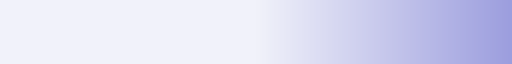

In [36]:
cmap0

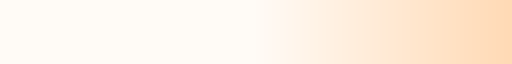

In [37]:
cmap1

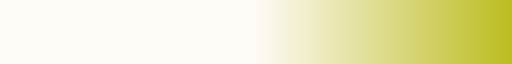

In [38]:
cmap2

In [47]:
plt_points0 = k3d.points(positions=x0,point_size=6,shader='flat',opacity=1,attribute=f0,color_map=cmap_array0,
                        color_range=[0, 2])


mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)
plot += plt_points0
plot += mesh
plot.display()

Output()

In [46]:

plt_points1 = k3d.points(positions=x1,point_size=6,shader='flat',opacity=1,attribute=f1,color_map=cmap_array1,
                        color_range=[0, 3])

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)

plot += plt_points1
plot += mesh
plot.display()

Output()

In [45]:

plt_points2 = k3d.points(positions=x2,point_size=6,shader='flat',opacity=1,attribute=f2,color_map=cmap_array2,
                        color_range=[0, 2])

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)

plot += plt_points2
plot += mesh
plot.display()

Output()

### marker drawing together

In [286]:
def trans_pN(x):
    x=np.array(x,dtype=np.float32)
    P_99=np.nanpercentile(x, 99)
    P_1=np.nanpercentile(x, 1)
    x[x>P_99]=P_99
    x[x<P_1]=P_1
    return x 
nodes = [0, 0.5,1.0]

import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.15
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter()

g='Satb2'
colors=['#ffffff', '#ffffff','#9467bc']
colors=['#f2edf7', '#f2edf7','#9467bc']
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
pcd_pc_select,pv_pc_select,_ = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               l_list=['DPall_0','DPall_1','DPall_2'],
                                               gene_list=[g])
pl.add_points(pv_pc_select,
              point_size=2,
              #opacity=0.8,
              scalars=g,
             cmap=cmap1,
              clim=[0,4]
             )

g='Tfap2b'
colors=['#ffffff', '#ffffff','#2b9f2b']
colors=['#e1f1e1', '#e1f1e1','#2b9f2b']
cmap3 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
pcd_pc_select,pv_pc_select,_ = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               l_list=['Midbrain'],
                                               gene_list=[g])
pl.add_points(pv_pc_select,
              point_size=2,
              scalars=g,
             cmap=cmap3,
              clim=[0,8]
             )

pl.add_mesh(pv_mesh,
            opacity=0.1,
            show_edges=s,
            edge_color=c)
pl.view_isometric()
#pl.show()

In [288]:
import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.15
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter()


g='Foxp1'
colors=['#ffffff', '#ffffff','#1e76b3']
colors=['#e4eef6', '#e4eef6','#1e76b3']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
pcd_pc_select,pv_pc_select,_ = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               l_list=['CSPall'],
                                               gene_list=[g])
pl.add_points(pv_pc_select,
              point_size=2,
              scalars=g,
             cmap=cmap5,
              clim=[0,6]
             )

g='Nr4a3'
colors=['#ffffff', '#ffffff','#11d8b8']
colors=['#eafcf9', '#eafcf9','#11d8b8']
cmap5 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
pcd_pc_select,pv_pc_select,_ = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               l_list=['MPall'],
                                               gene_list=[g])
pl.add_points(pv_pc_select,
              point_size=2,
              scalars=g,
             cmap=cmap5,
              clim=[0,3]
             )


pl.add_mesh(pv_mesh,
            opacity=0.1,
            show_edges=s,
            edge_color=c)
pl.view_isometric()
#pl.show()

## 6.3 cell

In [83]:
def trans_pN(x):
    x=np.array(x,dtype=np.float32)
    P_99=np.nanpercentile(x, 99.99)
    P_1=np.nanpercentile(x, 5)
    x[x>P_99]=P_99
    x[x<P_1]=P_1
    return x 
nodes = [0, 0.5,1.0]

### pyvista-cell

In [84]:
import trame
import pyvista as pv 
import pyvistaqt as pvqt
cpo = [(300,-1500 , 300),
 (300, 1900, 300),
 (-500, 0, 0)]
o=0.15
c='#969696'
s=False
#pl=pv.Plotter(shape=(3,3))
pl=pvqt.BackgroundPlotter()
cell=['Glutamatergic','GABAergic']
colors=['#ffffff', '#ffffff','#9467bc']
colors=['#f2edf7', '#f2edf7','#9467bc']
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
np_cell,pv_pc_select,_  = plot_3d_spatial(adata_3d,
                                               cluster='region',
                                               #l_list=['DPall_0','DPall_1','DPall_2'],
                                               cell_list=cell)
pl.add_points(pv_pc_select,
              point_size=2,
              #opacity=0.8,
              scalars='Glutamatergic',
             cmap=cmap1,
              #clim=[25,50]
             )

pl.add_mesh(pv_mesh,
            opacity=0.1,
            show_edges=s,
            edge_color=c)
pl.view_isometric()
#pl.show()

### K3D-cell

In [85]:
def trans_pN(x):
    x=np.array(x,dtype=np.float32)
    P_99=np.nanpercentile(x, 90)
    P_1=np.nanpercentile(x, 5)
    x[x>P_99]=P_99
    x[x<P_1]=P_1
    return x 

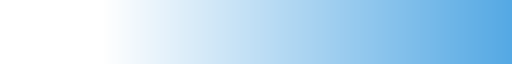

In [86]:
cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=0
nodes = [0, 0.2,1.0]
colors=['#ffffff', '#ffffff','#55a9e4']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)
x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = adata_3d.obs.loc[:,cell[i]]#np.array(adata_cell.obs['color_seq'])

cmap


In [87]:

plt_points = k3d.points(positions=x,
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        attribute=trans_pN(f),
                        color_map=cmap_array,
                        #color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot()
plot += plt_points
plot += mesh
plot.display()

Output()

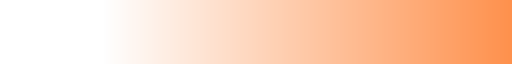

In [88]:
cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=1
nodes = [0, 0.2,1.0]
colors=['#ffffff', '#ffffff','#fe914d']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)
x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = adata_3d.obs.loc[:,cell[i]]#np.array(adata_cell.obs['color_seq'])

cmap


In [89]:

plt_points = k3d.points(positions=x,
                        point_size=5,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        attribute=trans_pN(f),
                        color_map=cmap_array,
                        #color_range=[0, 10]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot()
plot += plt_points
plot += mesh
plot.display()

Output()

In [ ]:

def remove_duplicates(input_list):
    new_list = []
    for element in input_list:
        if element not in new_list:
            new_list.append(element)
    return new_list
z =    remove_duplicates(adata_3d.obs['z'])


z[0:10]

## 6.4 Specify a cross-section to view a gene or cell

In [91]:

# x=1
# df_cell_count=pd.DataFrame((df_q05_cell_abundance_w_sf>x).sum(0))
# df_cell_count.index=[i.replace('q05cell_abundance_w_sf_','') for i in df_cell_count.index ]
# df_cell_count.columns=['count']
# df_cell_count=df_cell_count.sort_values(['count'],ascending =False)
# df_cell_count

Glutamatergic min_max_color: 0 - 100
GABAergic min_max_color: 0 - 50
Glycinergic min_max_color: 0 - 2
Serotoninergic min_max_color: 0 - 1
Dopaminergic min_max_color: 0 - 0.5


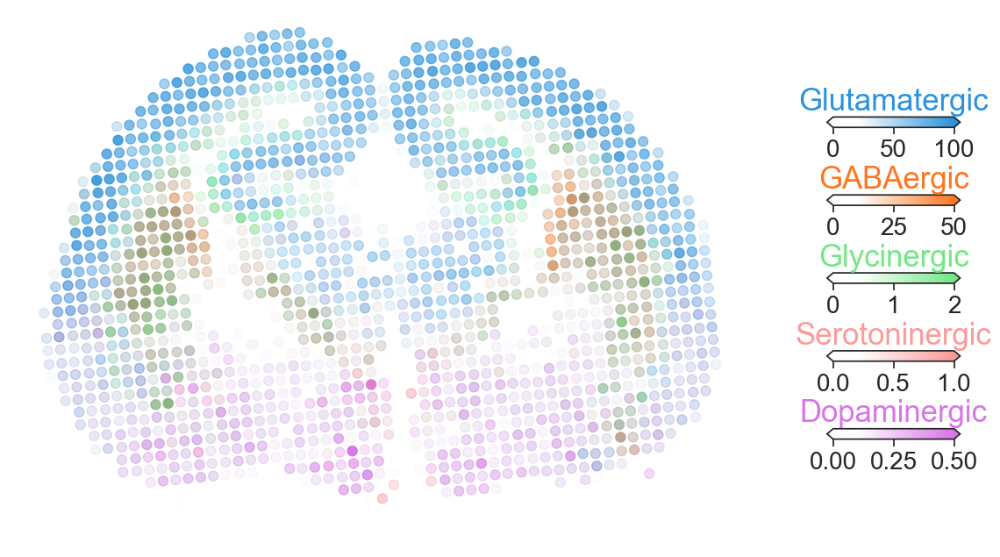

In [92]:
adata_st=adata_3d[adata_3d.obs['sample']=='10-4']
df_q05_cell_abundance_w_sf=adata_st.obs.iloc[:,11:]
cell_color={'Glutamatergic': '#2a93dd',
 'GABAergic': '#fe7620',
 'Neurotransmitter': '#0b9965',
 'Neuroblast': '#ff3359',
 'Glycinergic': '#74e685',
 'Neuron': '#fcef4b',
 'Neuronal intermediate progenitor': '#1f78b4',
 'Cajal-Retzius': '#01ecff',
 'Serotoninergic': '#fb9a99',
 'Dopaminergic': '#d974e8'}

#必备输入文件
clust_labels=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.variable name,'Glycinergic','Serotoninergic','Dopaminergic'
df_data=adata_st.obs.loc[:,clust_labels] #2.data frame
spatial_array=adata_st.obsm['spatial']#3.space coordinate-np.array(2*2)

plt.rcParams['figure.figsize']=(15,8)
sns.set(style="ticks", font_scale=1)
fig,color_RGBA,df_data=plot_Multiple(labels=clust_labels, # list
    value_df=df_data, #dataframe
    coords = spatial_array,
    cmaps=[cell_color[i] for i in clust_labels],
    circle_diameter=8.0,
    alpha_scaling=1,
    min_color_value=[0,0,0,0,0],#Defines the colourbar range. Priority over percentile
    max_color_value=[100,50,2,1,0.5],
    min_color_quantile=0.10,#Percentile definition colourbar range
    max_color_quantile=0.998,
    plt_axis="off",
    axis_y_flipped=True,
    x_y_labels=("", ""),
    crop_x=None,#xlim
    crop_y=None,#ylim
    style='fast',#'dark_background' or 'fast'
    colorbar_position = "right",
    colorbar_label_kw={"size": 25, "alpha": 1},
    colorbar_shape={"vertical_gaps": 3.5, "horizontal_gaps": 0, "width": 0.15, "height": 0.25},
    colorbar_tick_size=20,
    colorbar_grid=None,
    img=None,
    img_alpha=None,
    image_cmap="Greys_r",
    white_spacing=20)
             
plt.show()

In [ ]:
# sagittal plane (anatomy)
adata_st=adata_3d[(adata_3d.obsm['spatial_3d_align'][:,1]<250) & 
                        (adata_3d.obsm['spatial_3d_align'][:,1]>230)]
adata_st.obsm['spatial']=adata_st.obsm['spatial_3d_align'][:,[2,0]]
# horizontal plane
adata_st=adata_3d[(adata_3d.obsm['spatial_3d_align'][:,0]<300) & 
                        (adata_3d.obsm['spatial_3d_align'][:,0]>280)]

adata_st.obsm['spatial']=adata_st.obsm['spatial_3d_align'][:,[2,1]]


clust_labels=['Glutamatergic','GABAergic'] #1.'Glycinergic','Serotoninergic','Dopaminergic'
df_data=adata_st.obs.loc[:,clust_labels] #2.data frame
spatial_array=adata_st.obsm['spatial']#3.space coordinate-np.array(2*2)

plt.rcParams['figure.figsize']=(15,8)
sns.set(style="ticks", font_scale=1)
fig,color_RGBA,df_data=plot_Multiple(labels=clust_labels, # list
    value_df=df_data, #dataframe
    coords = spatial_array,
    cmaps=[cell_color[i] for i in clust_labels],
    circle_diameter=4.0,
    alpha_scaling=1,
    #min_color_value=[3,0.6],
   # max_color_value=[92,45],
    min_color_quantile=0.10,# percentile definition colourbar range
    max_color_quantile=0.998,
    plt_axis="off",
    axis_y_flipped=True,
    x_y_labels=("", ""),
    crop_x=None,#xlim
    crop_y=None,#ylim
    style='dark_background',#'dark_background' or 'fast'
    colorbar_position = "right",
    colorbar_label_kw={"size": 25, "alpha": 1},#Tag Title Attributes
    colorbar_shape={"vertical_gaps": 3.5, "horizontal_gaps": 0, "width": 0.15, "height": 0.25},#Tag Attributes
    colorbar_tick_size=20,#Label Scale Font Size
    colorbar_grid=None,
    img=None,
    img_alpha=None,
    image_cmap="Greys_r",
    white_spacing=20)
             
plt.show()

In [94]:
adata_3d_tmp=adata_3d[adata_3d.obs['sample'].isin(['7-4','10-7','17-5','20-3'])]

In [95]:
# adata_3d_tmp=adata_3d[((adata_3d.obsm['spatial_3d_align'][:,1]<245) & 
#                         (adata_3d.obsm['spatial_3d_align'][:,1]>235)) | ((adata_3d.obsm['spatial_3d_align'][:,1]<445) & 
#                         (adata_3d.obsm['spatial_3d_align'][:,1]>435)) ]

Glutamatergic min_max_color: 15 - 95
GABAergic min_max_color: 5 - 45
Glycinergic min_max_color: 0.26 - 1.74
Serotoninergic min_max_color: 0 - 0.85
Dopaminergic min_max_color: 0 - 0.5


meta NOT subset; don't know how to subset; dropped


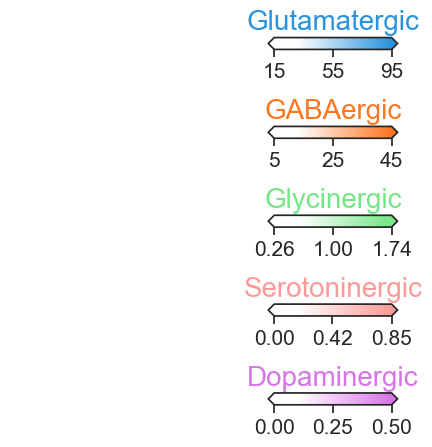

In [96]:
#----Required Input Files----##
clust_labels=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] 
df_data=adata_3d_tmp.obs.loc[:,clust_labels] 
spatial_array=adata_3d_tmp.obsm['spatial_3d_align']


plt.rcParams['figure.figsize']=(5,8)
sns.set(style="ticks", font_scale=1)
fig,color_RGBA,df_data=plot_Multiple(labels=clust_labels,
    value_df=pd.DataFrame(df_data),
    coords = None,
    cmaps=[cell_color[i] for i in clust_labels],
    alpha_scaling=1,         
    min_color_value=[15,5,0.26,0,0],
    max_color_value=[95,45,1.74,0.85,0.5],
    min_color_quantile=0.10,
    max_color_quantile=0.998,
    style='fast',#'dark_background' or 'fast'
    colorbar_position = "right",
    colorbar_label_kw={"size": 20, "alpha": 1},
    colorbar_shape={"vertical_gaps": 3.5, "horizontal_gaps": 0, "width": 0.5, "height": 0.25},
    colorbar_tick_size=15,
    white_spacing=20)
plt.show()

In [97]:
def hex_to_int_color(hex_color):
    int_color = int(hex_color.lstrip('#'), 16)  # 使用int()函数将十六进制字符串解释为整数值，并去除 #
    return int_color
color_hex=np.array([mpl.colors.rgb2hex(color_RGBA[i,:], keep_alpha=True) for i in range(color_RGBA.shape[0])])
color_int=np.array([hex_to_int_color(mpl.colors.rgb2hex(color_RGBA[i,:], keep_alpha=True)) for i in range(color_RGBA.shape[0])])

In [98]:
plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        #cmap=cmap,
                        #attribute=trans_pN(f),
                       # color_map=matplotlib_color_maps.Coolwarm,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.2)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

In [99]:
hex_to_int_color('#ffffff')

16777215

In [100]:
cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=0
nodes = [0, 0.2,1.0]
colors=['#ffffff', '#ffffff','#55a9e4']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)




plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        attribute=df_data[cell[0]],
                        color_map=cmap_array,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=16777215,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

In [101]:

cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=1
nodes = [0, 0.1,1.0]
colors=['#ffffff', '#ffffff','#fe914d']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        attribute=df_data[cell[1]],
                       color_map=cmap_array,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)

plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=16777215,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

In [102]:

cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=1
nodes = [0, 0.1,1.0]
colors=['#ffffff', '#ffffff','#90eb9d']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        attribute=df_data[cell[2]],
                       color_map=cmap_array,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)
plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=16777215,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

In [103]:

cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=1
nodes = [0, 0.1,1.0]
colors=['#ffffff', '#ffffff','#fcaead']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        attribute=df_data[cell[3]],
                       color_map=cmap_array,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)
plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=16777215,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

In [104]:

cell=['Glutamatergic','GABAergic','Glycinergic','Serotoninergic','Dopaminergic'] #1.变量名,
i=1
nodes = [0, 0.1,1.0]
colors=['#ffffff', '#ffffff','#ae5dba']
cmap=LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
cmap_list=[]
for x in np.linspace(0, 1, max(cmap.N, 256)):
    r, g, b = cmap(x)[:3]
    cmap_list=cmap_list+[x,r,g,b]
cmap_array=np.array(cmap_list)

plt_points = k3d.points(positions=spatial_array,
                        point_size=8,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors= color_int,
                        attribute=df_data[cell[4]],
                       color_map=cmap_array,
                        #color_range=[0, 1]
                       )

mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)
plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=16777215,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=True)
plot += plt_points
plot += mesh
plot.display()


Output()

# Fig 3D Developmental trajectory analysis - cortex

In [2]:
import k3d
from k3d.colormaps import matplotlib_color_maps
from  st_processing import trans_pN
adata_3d=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_interpolation.h5ad')
adata_3d.layers['raw'] = adata_3d.X.copy()
sc.pp.normalize_total(adata_3d,target_sum=1e4)
adata_3d.raw = adata_3d.copy()
sc.pp.log1p(adata_3d)
adata_3d=adata_3d[adata_3d.obs['region'].isin(['DPall_1','DPall_2','DPall_3'])]
sc.tl.pca(adata_3d, svd_solver="arpack", use_highly_variable=False)

import scanpy.external as sce
sce.pp.harmony_integrate(adata_3d, key =['sample'])

2024-05-01 14:06:05,817 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-01 14:06:12,583 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-01 14:06:12,697 - harmonypy - INFO - Iteration 1 of 10
2024-05-01 14:07:41,665 - harmonypy - INFO - Iteration 2 of 10
2024-05-01 14:09:07,691 - harmonypy - INFO - Iteration 3 of 10
2024-05-01 14:10:34,042 - harmonypy - INFO - Iteration 4 of 10
2024-05-01 14:12:00,521 - harmonypy - INFO - Iteration 5 of 10
2024-05-01 14:13:27,470 - harmonypy - INFO - Iteration 6 of 10
2024-05-01 14:14:54,436 - harmonypy - INFO - Iteration 7 of 10
2024-05-01 14:16:20,313 - harmonypy - INFO - Iteration 8 of 10
2024-05-01 14:17:45,643 - harmonypy - INFO - Iteration 9 of 10
2024-05-01 14:19:11,761 - harmonypy - INFO - Iteration 10 of 10
2024-05-01 14:20:35,745 - harmonypy - INFO - Stopped before convergence


In [3]:
sc.pp.neighbors(adata_3d,  use_rep='X_pca_harmony', n_neighbors=50)
#sq.gr.spatial_neighbors(adata_3d, coord_type="grid",spatial_key='spatial_3d_align')
# sc.tl.leiden(adata_3d, resolution=0.5,neighbors_key='spatial_neighbors')
#adata_3d.obsp['connectivities']  = adata_3d.obsp['connectivities'] + adata_3d.obsp['spatial_connectivities'] 
sc.tl.umap(adata_3d)
sc.tl.tsne(adata_3d)
sc.tl.leiden(adata_3d, resolution=0.5)
sc.tl.louvain(adata_3d, resolution=1)

In [ ]:
color_list=['#1f77b4','#ff7f0e','#f8e72e','#8c96c6','#9467bd','#807dba','#ffdab5',
            '#8c564b','#e377c2','#bcbd22','#12d9b9',
            '#8da0cb','#2ca02c','#9c9ede','#fb8072','#999999']
import seaborn as sns
plt.rcParams['figure.figsize']=(8,8)
sns.set(style="ticks", font_scale=1)

sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['region','sample'], 
           cmap='Spectral_r', 
           palette=color_list,
           #vmin='p1',vmax='p99',
               show=False)
#plt.savefig('D:/Task/Project/MAGIC_seq/Figure/Figure5/Cortex-3D_umap.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')


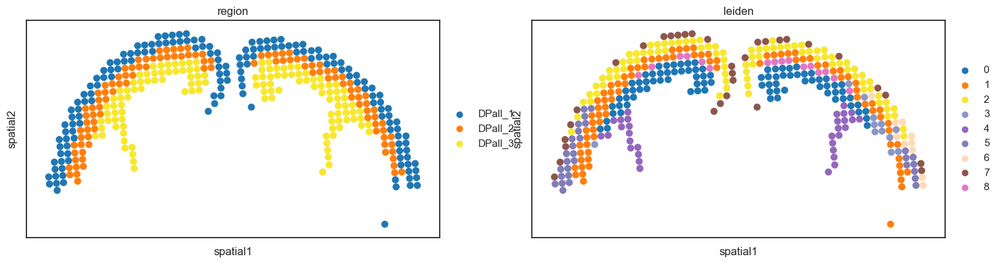

In [5]:
adata_st=adata_3d[adata_3d.obs['sample']=='10-4']
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=['region','leiden'],  palette=color_list,  vmin=0,vmax=8,
               #crop_coord= [-10,686,-10,686],
             show=True)

In [6]:
adata_3d.write('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_interpolation_DPall.h5ad')

# Monocle3 Python

In [14]:
import os
import h5py
import numpy as np
from scipy import sparse
from matplotlib import pyplot as plt
from py_monocle import learn_graph, order_cells
from py_monocle import compute_cell_states
from py_monocle import regression_analysis

## Learn the trajectory graph

In [15]:
projected_points, mst, centroids = learn_graph(
  matrix=adata_3d.obsm['X_umap'], clusters=np.array(adata_3d.obs['region']),
)

## Pseudotime

In [16]:
pseudotime = order_cells(
  adata_3d.obsm['X_umap'], centroids,
  mst=mst,
  projected_points=projected_points,
  root_cells=0,
)

## Plot trajectory graph

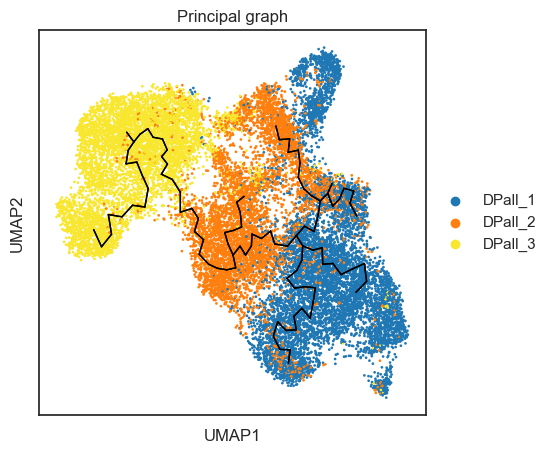

In [17]:
import seaborn as sns
plt.rcParams['figure.figsize']=(5,5)
sns.set(style="ticks", font_scale=1)
sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['region'], 
           cmap='Spectral_r', 
           palette=color_list,
           title='Principal graph',
               show=False)

edges = np.array(mst.nonzero()).T
for edge in edges:
  plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.show()

In [18]:
cell_states, _ = compute_cell_states(adata_3d.obsm['X_umap'], centroids, mst)
adata_3d.obs['cell_states']=cell_states
adata_3d.obs['pseudotime']=pseudotime

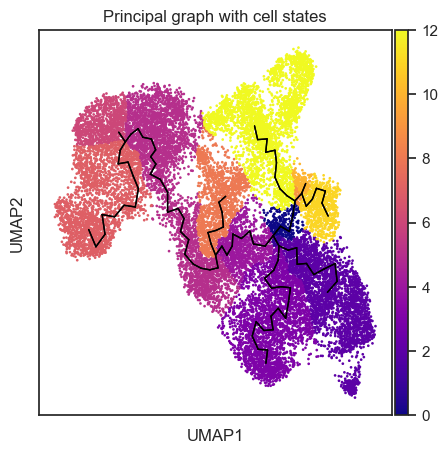

In [19]:
import seaborn as sns
plt.rcParams['figure.figsize']=(5,5)
sns.set(style="ticks", font_scale=1)
sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['cell_states'], 
           cmap='plasma', 
           palette=color_list,
           title='Principal graph with cell states',
               show=False)

edges = np.array(mst.nonzero()).T
for edge in edges:
  plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.show()




meta NOT subset; don't know how to subset; dropped


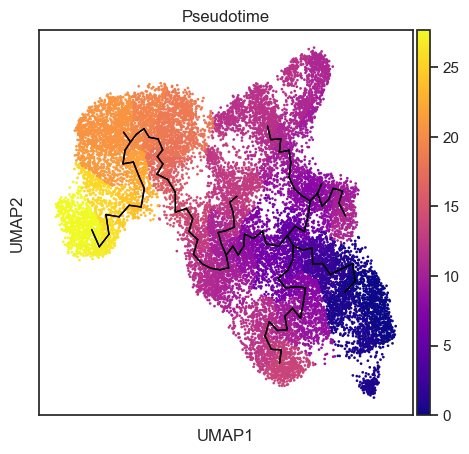

In [20]:
import seaborn as sns
plt.rcParams['figure.figsize']=(5.3,5)
sns.set(style="ticks", font_scale=1)
sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['pseudotime'], 
           cmap='plasma', 
           palette=color_list,
           title='Pseudotime',
               show=False)
edges = np.array(mst.nonzero()).T
for edge in edges:
  plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
    
plt.savefig('D:/Task/Project/MAGIC_seq/Figure/Figure5/3D-DPall-Pseudotime.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')
plt.show()




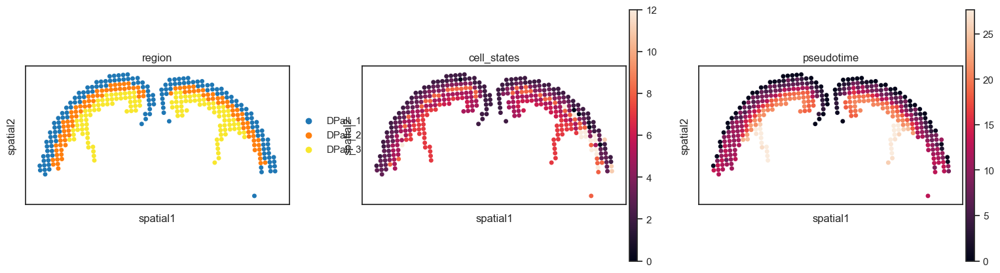

In [21]:
adata_st=adata_3d[adata_3d.obs['sample']=='10-4']
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=['region','cell_states','pseudotime'],  palette=color_list,  
              vmin='p1',vmax='p99',
               #crop_coord= [-10,686,-10,686],
             show=True)

In [22]:
def hex_to_int_color(hex_color):
    int_color = int(hex_color.lstrip('#'), 16)  
    return int_color
x = np.array(adata_3d.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = list(adata_3d.obs.loc[:,'pseudotime'])
# c=[region_color[i] for i in f ]
# color_int=np.array([hex_to_int_color(i) for i in c])

In [23]:

plt_points = k3d.points(positions=x,
                        point_size=6,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        #colors =color_int,
                        attribute=f,
                       color_map=matplotlib_color_maps.plasma,
                        #color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)
plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)
plot += plt_points
plot += mesh
plot.display()

Output()

In [24]:
d=dict(zip(['DPall_1','DPall_2','DPall_3'], ['#1f77b4','#ff7f0e','#f8e72e']))
def hex_to_int_color(hex_color):
    int_color = int(hex_color.lstrip('#'), 16)  # 使用int()函数将十六进制字符串解释为整数值，并去除 #
    return int_color
x = np.array(adata_st.obs[['col','row','z']])#adata_cell.obsm['spatial_3d_align']#.astype(np.float32)
f = list(adata_st.obs.loc[:,'region'])
c=[d[i] for i in f ]
color_int=np.array([hex_to_int_color(i) for i in c])

In [25]:

plt_points = k3d.points(positions=x,
                        point_size=12,
                        shader='flat',# {'flat', 'dot', '3d', '3dSpecular', 'mesh'}
                        opacity=1,
                        colors =color_int,
                        #attribute=f,
                       #color_map=matplotlib_color_maps.plasma,
                        #color_range=[0, 1]
                       )
mesh = k3d.mesh(vertices, faces,
                color=0xFFFFFF,
                opacity=0.15)
plot = k3d.plot(#background_color=0x1e1e1e,
    label_color=0x1e1e1e,
    axes=['', '', ''],
                menu_visibility=False,
               grid_visible=False)
plot += plt_points
plot += mesh
plot.display()

Output()

# scVelo

In [31]:
# Running RNA Velocity

scv.pp.filter_and_normalize(adata_3d,  n_top_genes=None,log=False)
scv.pp.moments(adata_3d, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata_3d, mode = "stochastic")
scv.tl.velocity_graph(adata_3d)


Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:14) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:27) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


D:\Exe\Anaconda3\envs\py39_spatial\Lib\site-packages\ipywidgets\widgets\widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/19562 [00:00<?, ?cells/s]

    finished (0:00:24) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Estimate RNA velocity

In [32]:
scv.tl.velocity(adata_3d)

computing velocities
    finished (0:00:27) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [33]:
scv.tl.velocity_graph(adata_3d)

computing velocity graph (using 1/16 cores)


D:\Exe\Anaconda3\envs\py39_spatial\Lib\site-packages\ipywidgets\widgets\widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/19562 [00:00<?, ?cells/s]

    finished (0:00:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Project the velocities

computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


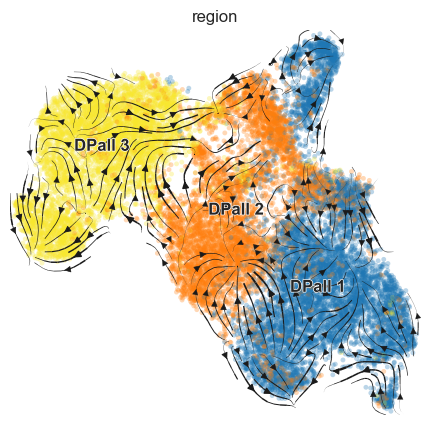

In [35]:
scv.pl.velocity_embedding_stream(adata_3d, basis='umap', color='region')

## Interprete the velocities

In [89]:
gene_list=['Sla','Hs3st4','Hmgb2','Sema3c']

In [ ]:
import seaborn as sns
sns.set(style="ticks", font_scale=1)
scv.pl.velocity(adata_3d, list(adata_3d.var_names[adata_3d.var.Symbol.isin(gene_list)]), 
                figsize=(4,4),
                ncols=2)

## Identify important genes¶

In [111]:
scv.tl.rank_velocity_genes(adata_3d, groupby='region', min_corr=.3)



ranking velocity genes


D:\Exe\Anaconda3\envs\py39_spatial\Lib\site-packages\scvelo\tools\utils.py:463: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:01:28) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


AttributeError: module 'scvelo' has no attribute 'DataFrame'

In [112]:
df = pd.DataFrame(adata_3d.uns['rank_velocity_genes']['names'])
df.head()

,DPall_1,DPall_2,DPall_3
0,ENSMUSG00000049336,ENSMUSG00000029819,ENSMUSG00000027831
1,ENSMUSG00000059187,ENSMUSG00000039037,ENSMUSG00000039410
2,ENSMUSG00000031561,ENSMUSG00000090063,ENSMUSG00000038718
3,ENSMUSG00000054733,ENSMUSG00000028364,ENSMUSG00000060424
4,ENSMUSG00000008575,ENSMUSG00000038679,ENSMUSG00000100832


In [ ]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='DPall_1,DPall_2,DPall_3')

scv.pl.scatter(adata_3d, df['DPall_1'][:5], ylabel='DPall_1',color=['region'] ,**kwargs)
scv.pl.scatter(adata_3d, df['DPall_2'][:5], ylabel='DPall_2', color=['region'] ,**kwargs)
scv.pl.scatter(adata_3d, df['DPall_3'][:5], ylabel='DPall_3', color=['region'] ,**kwargs)

## Velocity graph and pseudotime

In [ ]:
scv.pl.velocity_graph(adata_3d, threshold=.1,groups=['region'])

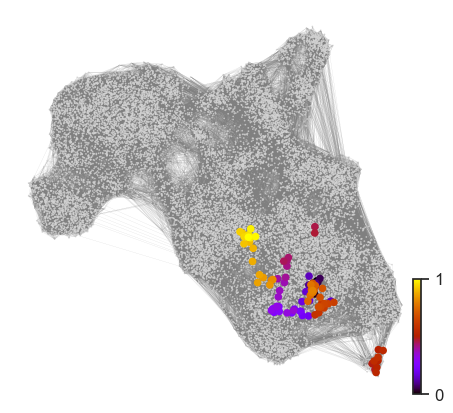

In [190]:
x, y = scv.utils.get_cell_transitions(adata_3d, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata_3d, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_3d, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 10 regions of root cells and 1 region of end points .
    finished (0:00:36) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


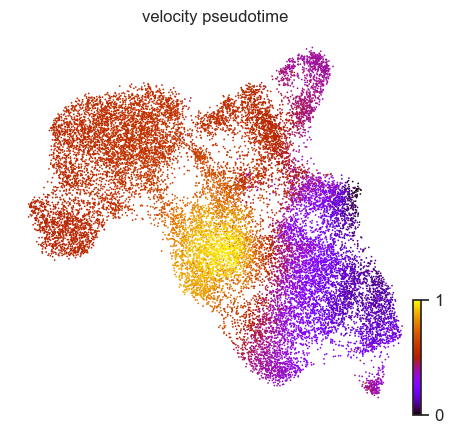

In [192]:
scv.tl.velocity_pseudotime(adata_3d)
scv.pl.scatter(adata_3d, color='velocity_pseudotime', cmap='gnuplot')

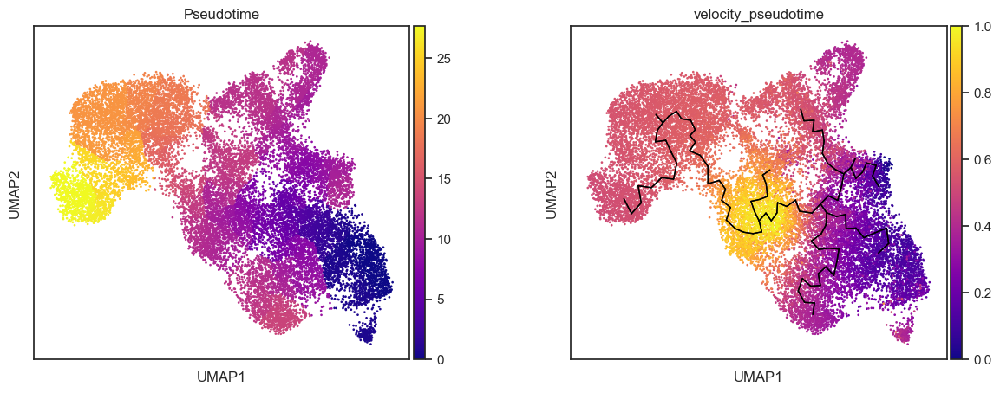

In [194]:
import seaborn as sns
plt.rcParams['figure.figsize']=(5.3,5)
sns.set(style="ticks", font_scale=1)
sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['pseudotime','velocity_pseudotime'], 
           cmap='plasma', 
           palette=color_list,
           title='Pseudotime',
               show=False)
edges = np.array(mst.nonzero()).T
for edge in edges:
  plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)

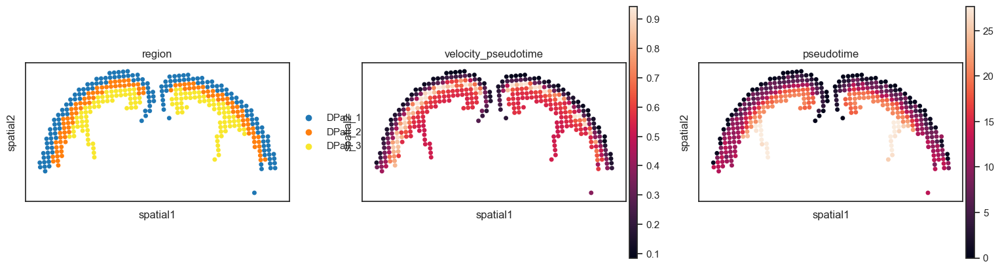

In [195]:
adata_st=adata_3d[adata_3d.obs['sample']=='10-4']
sc.pl.spatial(adata_st, img_key=None,spot_size=10, gene_symbols='Symbol', #alpha=0.8,
              color=['region','velocity_pseudotime','pseudotime'],  palette=color_list,  
              vmin='p1',vmax='p99',
               #crop_coord= [-10,686,-10,686],
             show=True)

## Dynamical Model

In [ ]:

adata_3d=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_interpolation.h5ad')
adata_3d=adata_3d[adata_3d.obs['region'].isin(['DPall_1','DPall_2','DPall_3'])]
adata_3d.layers['raw'] = adata_3d.X.copy()
scv.pp.filter_and_normalize(adata_3d, min_shared_counts=20, n_top_genes=6000)
scv.pp.moments(adata_3d, n_pcs=30, n_neighbors=30)

In [228]:
scv.tl.recover_dynamics(adata_3d)

recovering dynamics (using 1/16 cores)


D:\Exe\Anaconda3\envs\py39_spatial\Lib\site-packages\ipywidgets\widgets\widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/331 [00:00<?, ?gene/s]

    finished (0:12:29) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [229]:
scv.tl.velocity(adata_3d, mode='dynamical')
scv.tl.velocity_graph(adata_3d)

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


D:\Exe\Anaconda3\envs\py39_spatial\Lib\site-packages\ipywidgets\widgets\widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/19562 [00:00<?, ?cells/s]

    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [232]:
adata=sc.read('../file/Mouse_Embryo_Brain_3D/st_adata/adata_3D_with_Cell_interpolation_DPall.h5ad')

In [240]:
adata_3d.uns['region_colors']=adata.uns['region_colors']

In [235]:
adata_3d.obsm['X_umap']=adata.obsm['X_umap']

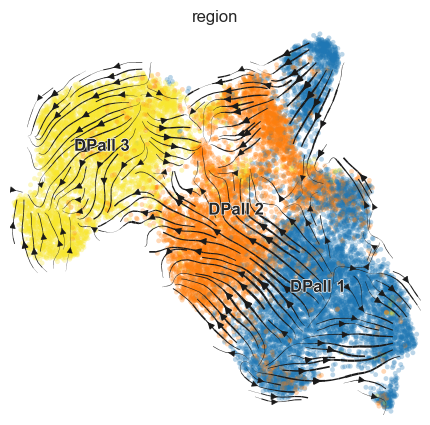

In [241]:
scv.pl.velocity_embedding_stream(adata_3d, basis='umap', color='region')

In [ ]:
df = adata_3d.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_3d, 'fit*', dropna=True).head()

## Latent time¶

computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


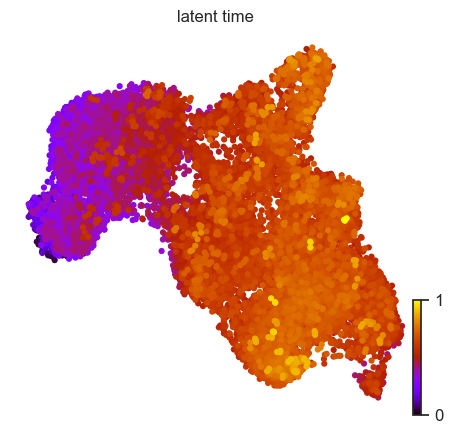

In [242]:
scv.tl.latent_time(adata_3d)
scv.pl.scatter(adata_3d, color='latent_time', color_map='gnuplot', size=80)

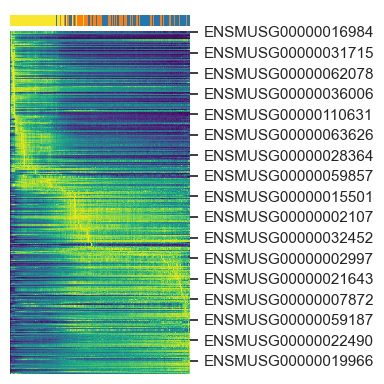

In [255]:
top_genes = adata_3d.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_3d, var_names=top_genes, sortby='latent_time',
               col_color='region', n_convolve=100,figsize=(4,4)
              )

[<AxesSubplot: title={'center': 'velocity_pseudotime'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot: title={'center': 'latent_time'}, xlabel='UMAP1', ylabel='UMAP2'>]

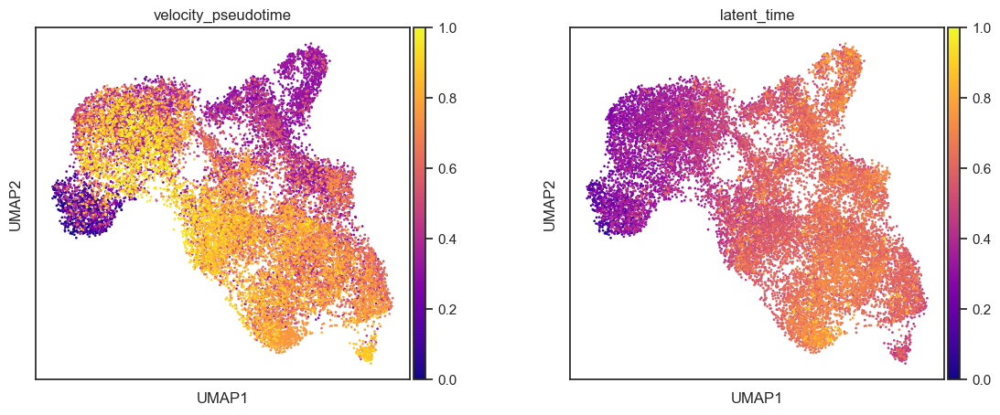

In [260]:
import seaborn as sns
plt.rcParams['figure.figsize']=(5,5)
sns.set(style="ticks", font_scale=1)
sc.pl.umap(adata_3d, #legend_loc='on data',
           size=15, #alpha=0.8,
           wspace=.3,
              color=['velocity_pseudotime','latent_time'], 
           cmap='plasma', 
           palette=color_list,
          # title='Pseudotime',
               show=False)